This notebook is supposed to contain all calculations that pertain to column densities. That didn't quite turn out to be right, but it's pretty accurate. We start off by loading in on the relevant data, then calculate the temperature and subsequent sound speed from the NH3 data. Next, we calculate the column density maps with Mangum method and tested out a bunch of different excitation temperatures to determmine when the fitting becomes unphysical. We then centre the H2 data onto the HC5N data and regrid it. From there, we do some column density/total mass calculations. Then, there was the whole mess with trying to measure the relative column densities before we knew how to rotate data. Either way, that still showed us that HC5N is offset to the north from H2. This notebook closes out with the identification of Jean's Length blobs.

In [4]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from ROHSApy import ROHSA
import astropy
import astropy.units as u
import astropy.constants as c
from astropy import wcs
from spectral_cube import SpectralCube
from importlib import reload
from photutils import find_peaks
import r_mod
import matplotlib.gridspec as gridspec
import time
from fractions import Fraction
import os
import column_density as cd
from scipy.optimize import curve_fit
from scipy import ndimage, misc
from astropy.nddata.utils import Cutout2D
from astropy.coordinates import SkyCoord
from mpl_toolkits import mplot3d
import FITS_tools

In [2]:
r_mod = reload(r_mod)
cd = reload(cd)

## Load in all relevant data

In [3]:
tmc1_hdu = fits.open('tmc1_ls.fits')
ls_hdu = fits.open('ls.fits')

hdul2 = fits.open('/Users/simonsmith/Documents/SURP/Data/HC2_HC5N_all_rebase3_mom0_QA_trim.fits')
coord_head = hdul2[0].header

hdul3 = fits.open('/Users/simonsmith/Documents/SURP/HC2/parameterMaps/HC2_NH3_Tkin_all_rebase3_masked.fits')
temp_head = hdul3[0].header
temp_data = hdul3[0].data

hdul4 = fits.open('/Users/simonsmith/Documents/SURP/Data/HC2_NH3_11_all_rebase3_mom0_QA_trim.fits')
nh3_head = hdul4[0].header
nh3_data = hdul4[0].data

ls_tmc1 = Cutout2D(hdul2[0].data, position=(60, 165), size=(70, 60), wcs=wcs.WCS(coord_head))
test_header = ls_tmc1.wcs.to_header()
test_header['NAXIS1'] = 60
test_header['NAXIS2'] = 70

nh3_tmc1 = Cutout2D(nh3_data, position=(60, 165), size=(70, 60), wcs=wcs.WCS(temp_head))
temp_tmc1 = Cutout2D(temp_data, position=(60, 165), size=(70, 60), wcs=wcs.WCS(temp_head))
hc5n_tmc1 = Cutout2D(hdul2[0].data, position=(60, 165), size=(70, 60), wcs=wcs.WCS(temp_head))

g1_intensity, g2_intensity, g3_intensity = tmc1_hdu[1].data, tmc1_hdu[2].data, tmc1_hdu[3].data
g1_velocity, g2_velocity, g3_velocity = tmc1_hdu[4].data, tmc1_hdu[5].data, tmc1_hdu[6].data
g1_dispersion, g2_dispersion, g3_dispersion = tmc1_hdu[7].data, tmc1_hdu[8].data, tmc1_hdu[9].data

pix_scale_au = (((test_header['CDELT2']*u.deg).to(u.rad))/u.rad*140*u.pc).to(u.au)
beam_width = float((((coord_head['BMIN']*u.deg).to(u.rad))/u.rad*140*u.pc).to(u.au)/pix_scale_au)

## Ammonia and Ammonia Temperature

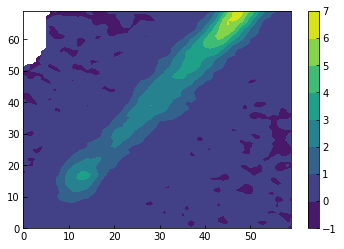

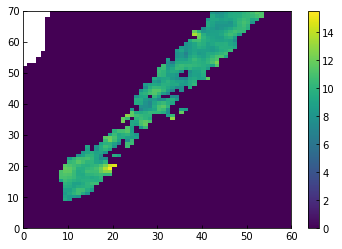

In [20]:
plt.contourf(nh3_tmc1.data)
plt.colorbar()
plt.show()
plt.pcolormesh(temp_tmc1.data)
plt.colorbar()
plt.show()

In [21]:
tester = temp_tmc1.data
tester[np.where(tester == 0)] = np.nan
T = np.nanmean(tester)*u.K
MM = 75.0681*u.g/u.mol
Vrms = (np.sqrt(c.k_B*T/(MM/c.N_A))).to(u.km/u.s)
cs = (np.sqrt(c.k_B*T/c.m_p/2.33)).to(u.km/u.s)

Vrms, cs

(<Quantity 0.03260513 km / s>, <Quantity 0.1844002 km / s>)

In [22]:
tot_rot = ndimage.rotate(g1_intensity+g2_intensity+g3_intensity, -35, reshape=True)

<Quantity 0.07166325 pc>

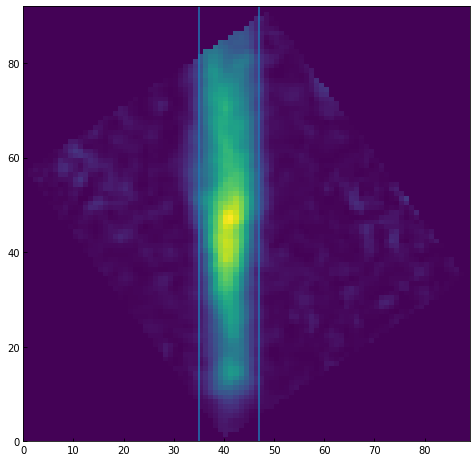

In [23]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(tot_rot)
plt.axvline(35)
plt.axvline(47)

(47-35)*pix_scale_au.to(u.pc)

To better study the stability of this gas filament, we must take into account the thermal support within the cylindrical structure. We were able to put an upper and lower constraint on the temperature of the Hydrogen gas through two different methods.

The GAS collaboration also observed this region in ammonia and calculated a mean temperature for each pixel using a method based on Mangum and Shirley (2017) which can be found in GAS (2017). Averaging across the whole filament, we find an upper bound of temperature of 9.6K. We are peering into the densest parts of this filament, where cold, slow moving gas is clumping together, planting seeds of more compact structure.

To find the lower bound, we turn to our calculations of the HC$_5$N column densities. We use a method developed by Mangum and Shirley (2017). The most important free parameter in the calculation is the excitation temperature. This temperature acts as our proxy for the partition function of HC$_5$N in it's environment. We are only observing head-on emission from the 9-8 rotational transition of this molecule, but much more of it would exist in reality. By setting the excitation temperature, the column density calculation method accounts for the population of HC$_5$N at all other transitions to find the total. 

However, the most important aspect of ROHSA's fitting method is that is regulates how smoothly the values of intensity, velocity, and velocity dispersion can vary from pixel to pixel. Having set a decent amount of smooth when we fit the data, we expect this smoothness to persist through additional calculations. Doing a [chi2?] test across the image, we have found that for temperatures below 7.3K, the variation in column density from pixel to pixel is too high to be a reasonable representation of the initial data. Therefore, we conclude that the excitation temperature in this environment is 7.3K.

We now have our excitation temperature boundary for the region, coming in at 7.3-9.6K.


notes:
why is it okay for this constraint to exist again?
find method of NH3 temp calculation (GAS data paper)
quanitfy that smoothness, maybe with same regulation method as ROHSA? -- neighbouring pixel change comparison

Temperature constrained to be 7.3-9.6K, show this more concretely, but it's a fairly good limit. 7.3 from choppy fits as Excitation temp fed into column density calculator. 9.6 from NH3 data done by GAS collab.

In [24]:
#TMC-1 Lower Section Masks

ls_mask1 = g1_intensity > 0.03
ls_g1 = np.empty(ls_mask1.shape)
ls_g1.fill(np.nan)
ls_g1[ls_mask1 == True] = 1

ls_mask2 = g2_intensity > 0.08
ls_g2 = np.empty(ls_mask2.shape)
ls_g2.fill(np.nan)
ls_g2[ls_mask2 == True] = 1

ls_mask3 = g3_intensity > 0.05 
ls_g3 = np.empty(ls_mask3.shape)
ls_g3.fill(np.nan)
ls_g3[ls_mask3 == True] = 1

total_int = g1_intensity+g2_intensity+g3_intensity
ls_maskt = total_int > 0.16
ls_gt = np.empty(ls_maskt.shape)
ls_gt.fill(np.nan)
ls_gt[ls_maskt == True] = 1

## Column Density from Mangum & Shirley

In [25]:
hc5n_params = {'nu' : 23.9638968*u.GHz,
                   'jlow' : 8,
                   'jup' : 9,
                   'Elow' : 4.6003*u.K,
                   'Eup' : 5.7505*u.K,
                   'mu' : 4.33e-18*u.esu*u.cm,
                   'Sij' : 0.47, 
                   'b' : 1331.33*u.MHz}


tex = 8.5*u.K
nu = hc5n_params['nu']
tbg = 2.73*u.K

In [26]:
tmb_ls_g1, dv_ls_g1 = g1_intensity/g1_dispersion*u.K, g1_dispersion*u.m/u.s
tmb_ls_g2, dv_ls_g2 = g2_intensity/g2_dispersion*u.K, g2_dispersion*u.m/u.s
tmb_ls_g3, dv_ls_g3 = g3_intensity/g3_dispersion*u.K, g3_dispersion*u.m/u.s

n_ls_g1, tau_ls_g1 = cd.calc_n_mangum(tmb_ls_g1,tex,dv_ls_g1,hc5n_params,0)
n_ls_g2, tau_ls_g2 = cd.calc_n_mangum(tmb_ls_g2,tex,dv_ls_g2,hc5n_params,0)
n_ls_g3, tau_ls_g3 = cd.calc_n_mangum(tmb_ls_g3,tex,dv_ls_g3,hc5n_params,0)

n_ls_g1 = n_ls_g1.decompose()
n_ls_g2 = n_ls_g2.decompose()
n_ls_g3 = n_ls_g3.decompose()

n_ls_gt = n_ls_g1+n_ls_g2+n_ls_g3

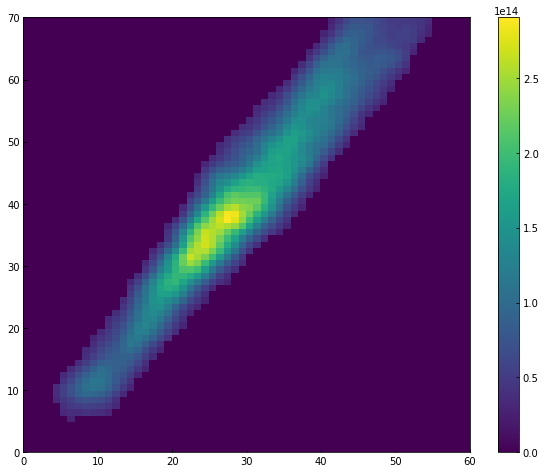

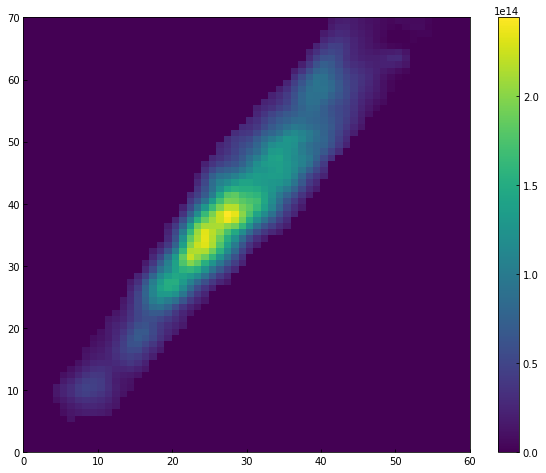

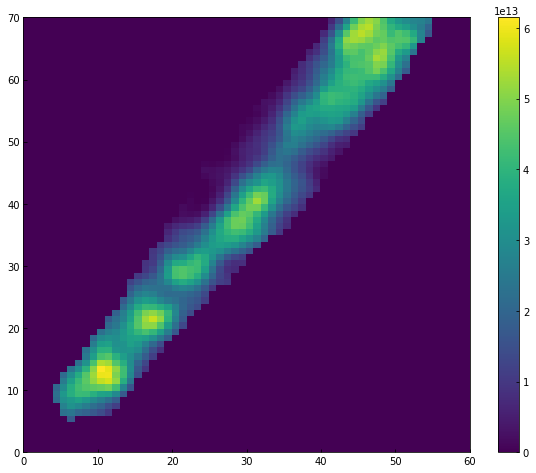

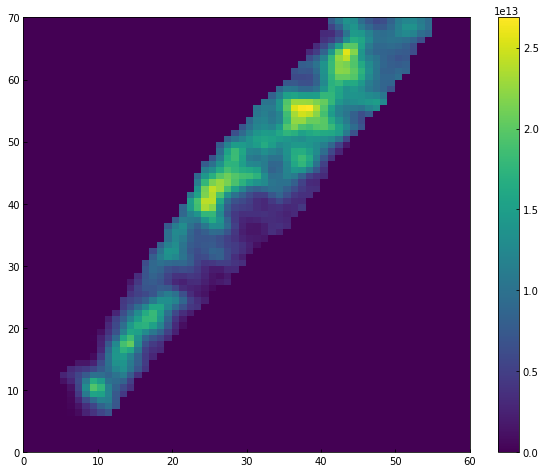

In [27]:
plt.figure(figsize=(10, 8))
plt.pcolormesh(ls_maskt*(n_ls_gt))
plt.colorbar()
plt.show()
plt.figure(figsize=(10, 8))
plt.pcolormesh(ls_maskt*n_ls_g1)
plt.colorbar()
plt.show()
plt.figure(figsize=(10, 8))
plt.pcolormesh(ls_maskt*n_ls_g2)
plt.colorbar()
plt.show()
plt.figure(figsize=(10, 8))
plt.pcolormesh(ls_maskt*n_ls_g3)
plt.colorbar()
plt.show()

In [28]:
total_gas_g1 = np.ravel(ls_gt*n_ls_g1)
total_gas_g1 = total_gas_g1[~np.isnan(total_gas_g1)]
hc5n_N_g1 = np.sum((total_gas_g1*pix_scale_au**2).decompose())

total_gas_g2 = np.ravel(ls_gt*n_ls_g2)
total_gas_g2 = total_gas_g2[~np.isnan(total_gas_g2)]
hc5n_N_g2 = np.sum((total_gas_g2*pix_scale_au**2).decompose())

total_gas_g3 = np.ravel(ls_gt*n_ls_g3)
total_gas_g3 = total_gas_g3[~np.isnan(total_gas_g3)]
hc5n_N_g3 = np.sum((total_gas_g3*pix_scale_au**2).decompose())

n_ls_tot = n_ls_g1+n_ls_g2+n_ls_g3

In [29]:
am = (n_ls_tot[40, 30]*(pix_scale_au**2)).decompose()

In [30]:
am*75.05*c.m_p.to(u.M_sun)

<Quantity 4.83093615e-13 solMass>

In [31]:
tex_range = np.arange(7.2, 12.1, 0.1)*u.K
g1_maps = []
for t in tex_range:

    n_ls_g1, tau_ls_g1 = cd.calc_n_mangum(tmb_ls_g1,t,dv_ls_g1,hc5n_params,0)
    g1_maps.append(tau_ls_g1)

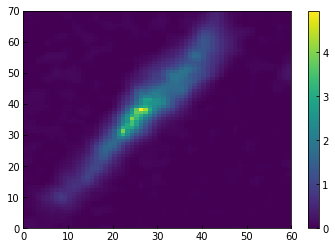

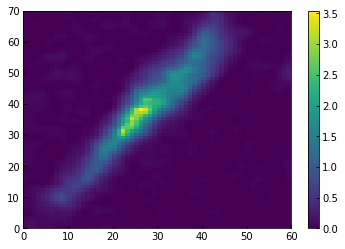

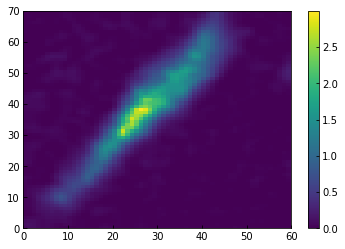

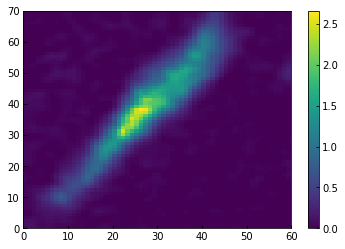

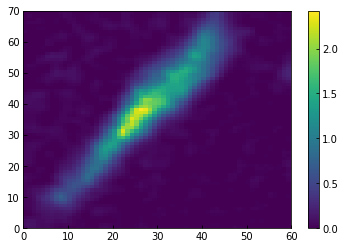

...

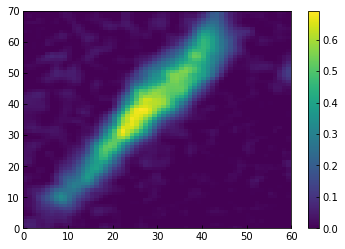

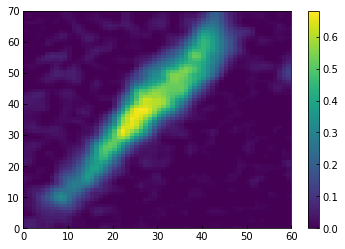

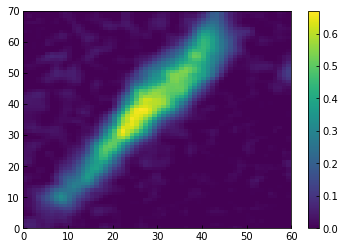

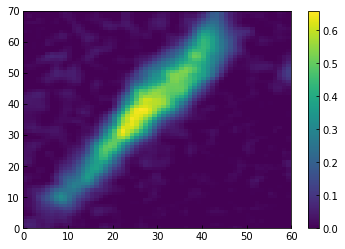

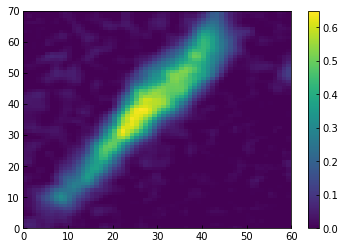

In [15]:

for i in g1_maps:
    plt.pcolormesh(i)
    plt.colorbar()
    plt.show()


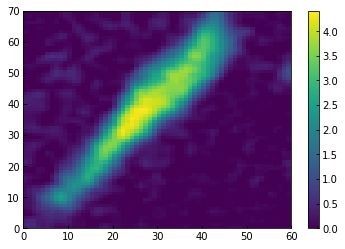

In [16]:
plt.pcolormesh(tmb_ls_g1)
plt.colorbar()

Opacities max out around 1.4, so not very opaque in general. This means we can see through most of the filament. This is highly supportive of our assymetric accrection model. If it was very opaque, it would be fair to say that we don't know if there is accretion on the back side. However, because it is thin, then we should be able to see a second spike of HC$_5$N on the south side of the H$_2$ ridgeline, indicating in falling material, genrating new carbon-chain material. We see no such spike. This is good evidence that there is no accretion on the back side (assuming the filament infall plane is point quite close to us).

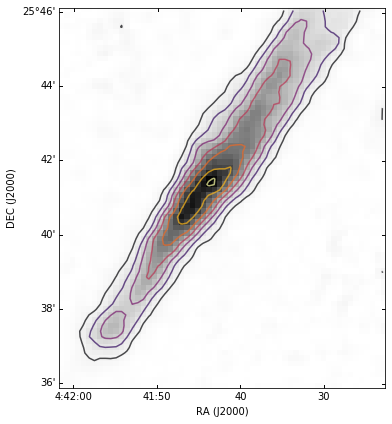

In [17]:
fig = plt.figure(figsize=(6, 7), constrained_layout=False)
ax1 = fig.add_subplot(111, projection=ls_tmc1.wcs)
im = ax1.imshow(n_ls_tot*u.m**2, cmap='Greys')
ax1.contour(total_int, cmap='inferno', alpha=0.7)
ra = ax1.coords[0]
ra.set_major_formatter('hh:mm:ss')
ra.set_separator(':')
dec = ax1.coords[1]
ax1.set_xlabel('RA (J2000)')
ax1.set_ylabel('DEC (J2000)')
#dec.set_ticklabel_visible(False)
#ra.set_ticklabel_visible(False)

#cbar = plt.colorbar(im, fraction=0.04, pad=0.03,orientation='horizontal')
#cbar.set_label('intensity (K km/s)')

#plt.savefig('tot_density.png')

In [18]:
n_ls_tot[40][30].to(1/u.cm**2)

<Quantity 2.25349794e+10 1 / cm2>

## Herschel Hydrogen Map, rescaled to the size of the GBT data

In [32]:
hdul = fits.open('/Users/simonsmith/Documents/SURP/Data/TauTMC_colden_500_reso_masked.fits')
colden_head = hdul[0].header
colden_data = hdul[0].data

ls_head = ls_hdu[1].header

sizera = float((ls_head['NAXIS1']*ls_head['CDELT2']*u.deg).to(u.arcmin)/u.arcmin)
sizedec = float((ls_head['NAXIS2']*ls_head['CDELT2']*u.deg).to(u.arcmin)/u.arcmin)

colden_w = wcs.WCS(colden_head)
tmc1ctr = SkyCoord('4h41m42.3s 25d40m56.34247s', frame='fk5')
size = u.Quantity((sizedec, sizera), u.arcmin)


tmc1 = Cutout2D(colden_data,position=tmc1ctr,size=size,wcs=colden_w)

colden_mask = tmc1.data > 1e22
g_colden = np.empty(colden_mask.shape)
g_colden.fill(np.nan)
g_colden[colden_mask == True] = 1

colden_re = FITS_tools.hcongrid.hcongrid(colden_data,colden_head,test_header)

icolden_mask = []
for i in colden_mask:
    icolden_mask.append(r_mod.TtF(i))
    
icolden_mask = np.array(icolden_mask)
ig_colden = np.empty(icolden_mask.shape)
ig_colden.fill(np.nan)
ig_colden[icolden_mask == True] = 1


np.max(tmc1.data)

1.6505246371370689e+22

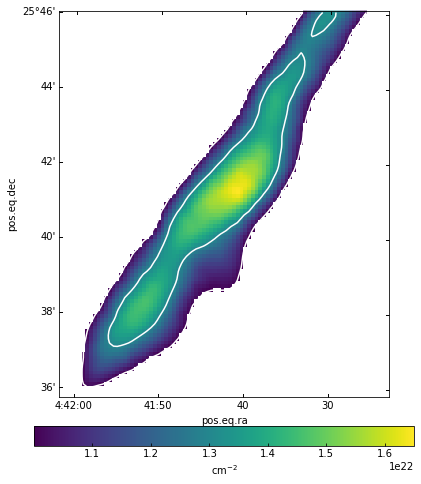

In [33]:
fig = plt.figure(figsize=(15,9))
ax1 = fig.add_subplot(121, projection=tmc1.wcs)
im = ax1.imshow(g_colden*tmc1.data,cmap='viridis')
ax1.contour(tmc1.data,levels=[5.e21,1.e22,1.3e22],colors='white')#,transform=ax1.get_transform(wcsNH3))
#ax1.text(0.15,0.7,'N(H$_2$)',size=14,color='white',transform=ax1.transAxes)
cbar = plt.colorbar(im,pad=0.06,orientation='horizontal')
cbar.set_label('cm$^{-2}$')
ra = ax1.coords[0]
ra.set_major_formatter('hh:mm:ss')
ra.set_separator(':')

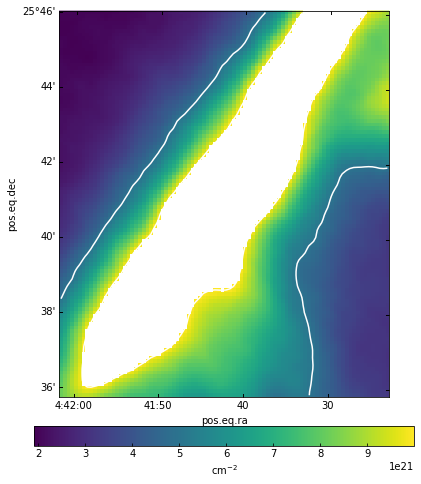

In [34]:
fig = plt.figure(figsize=(15,9))
ax1 = fig.add_subplot(121, projection=tmc1.wcs)
im = ax1.imshow(ig_colden*tmc1.data,cmap='viridis')
ax1.contour(tmc1.data,levels=[5.e21,1.e22,1.3e22],colors='white')#,transform=ax1.get_transform(wcsNH3))
#ax1.text(0.15,0.7,'N(H$_2$)',size=14,color='white',transform=ax1.transAxes)
cbar = plt.colorbar(im,pad=0.06,orientation='horizontal')
cbar.set_label('cm$^{-2}$')
ra = ax1.coords[0]
ra.set_major_formatter('hh:mm:ss')
ra.set_separator(':')

In [35]:
angle=-35
colden_re_rot = ndimage.rotate(colden_re, angle, reshape=True)

(<Quantity 0.10152293 pc>, <Quantity 0.47775498 pc>)

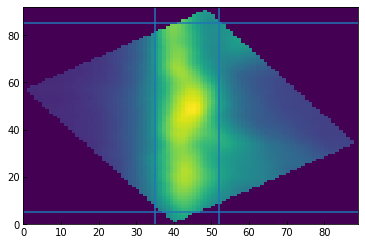

In [54]:
plt.pcolormesh(colden_re_rot)
plt.axvline(35)
plt.axvline(52)
plt.axhline(5)
plt.axhline(85)

(52-35)*pix_scale_au.to(u.pc), (85-5)*pix_scale_au.to(u.pc)

In [177]:
rho_0 = (np.nanmean(colden_re_rot[5:85, 35:52])/u.cm**2/0.1/u.pc).to(1/u.cm**3)*2.8*c.m_p
rho_1 = (1e4/u.cm**3)*2.33*c.m_p
A = 2.4
t = A*np.sqrt(np.pi/16/rho_0/c.G)
t.to(u.yr)

<Quantity 311419.94841623 yr>

In [ ]:
# plt.plot(np.nanmean(colden_re_rot, axis=0))
x = np.arange(0, colden_re_rot.shape[1])
for i in colden_re_rot:
    plt.plot(x, i)
plt.show()

/Users/simonsmith/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in double_scalars
  after removing the cwd from sys.path.
/Users/simonsmith/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in double_scalars
  """


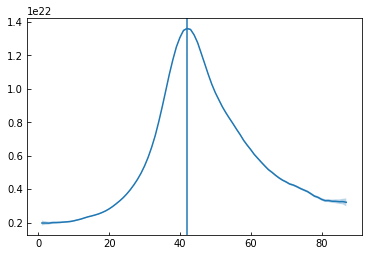

In [38]:
h2_profile = []
h2_profile_std = []
for i in range(0, colden_re_rot.shape[1]):
    h2_profile.append(np.sum(colden_re_rot[:, i]) / np.sum(colden_re_rot[:, i] > 0))
    h2_profile_std.append(np.std(colden_re_rot[:, i]) / np.sum(colden_re_rot[:, i] > 0))

h2_profile = np.array(h2_profile)    
h2_profile_std = np.array(h2_profile_std)
x = np.arange(0, len(h2_profile))    
plt.plot(x, h2_profile)
plt.fill_between(x, h2_profile+h2_profile_std, h2_profile-h2_profile_std, alpha=0.3)
plt.axvline(42)
np.array(h2_profile)[1]
plt.show()


#plt.plot( h2_profile[1:43] )

In [39]:
h2_profile_std

array([           nan, 1.43665327e+20, 1.00395888e+20, 8.07320033e+19,
       7.02254185e+19, 5.89429616e+19, 5.37635237e+19, 4.98535837e+19,
       4.65829512e+19, 4.39193957e+19, 4.20055659e+19, 4.05505873e+19,
       3.81933893e+19, 3.83521227e+19, 3.65589466e+19, 3.56076542e+19,
       3.47929598e+19, 3.41106787e+19, 3.37092657e+19, 3.27199360e+19,
       3.34659475e+19, 3.29505942e+19, 3.33065847e+19, 3.44098559e+19,
       3.41080259e+19, 3.47286680e+19, 3.46568993e+19, 3.63289684e+19,
       3.64057809e+19, 3.74795807e+19, 3.97719368e+19, 4.02968588e+19,
       4.20342394e+19, 4.39081923e+19, 4.60873644e+19, 4.65724859e+19,
       4.81393602e+19, 5.10997112e+19, 4.87851070e+19, 4.69429914e+19,
       4.63774240e+19, 4.74657029e+19, 4.51438115e+19, 4.84837110e+19,
       4.82833311e+19, 4.78097008e+19, 4.40301972e+19, 4.45674298e+19,
       4.18675856e+19, 4.09175008e+19, 4.19953133e+19, 4.48087251e+19,
       4.40504027e+19, 4.53751466e+19, 4.83559066e+19, 4.97610301e+19,
      

In [40]:
(profile[0]/u.cm**2/(52-35)/pix_scale_au).to(1/u.cm**3)

NameError: name 'profile' is not defined

In [41]:
#Data to fit for Plummer:

#h2_profile[43:1]

profile = h2_profile[1:43][::-1]
profile_std = h2_profile_std[1:43][::-1]
r = np.arange(0, len(profile))*pix_scale_au.to(u.pc)

B = float(profile[-1]/u.cm**2*u.cm**2)
A = np.pi/2
nc = float(((profile[0]/u.cm**2/(52-35)/pix_scale_au).to(1/u.cm**3))*u.cm**3)
Rf = float((0.07*u.pc).to(u.cm)/u.cm)
p = 2

plum_profile = ((A*nc*Rf)/((1+(np.array((r.to(u.cm)/u.cm))/Rf)**2)**((p-1)/2)))+B

In [42]:
nc

43419.38308242615

In [30]:
def plum(r, A, nc, Rf, p=2):
    
    return np.array(((A*nc*Rf)/((1+(r/Rf)**2)**((p-1)/2))))

In [31]:
plum((np.array((r.to(u.cm)/u.cm))), A, nc, Rf)

array([1.47316744e+22, 1.46783539e+22, 1.45218008e+22, 1.42716534e+22,
       1.39422124e+22, 1.35503602e+22, 1.31135035e+22, 1.26479385e+22,
       1.21678091e+22, 1.16846375e+22, 1.12072916e+22, 1.07422258e+22,
       1.02938545e+22, 9.86495869e+21, 9.45706710e+21, 9.07078400e+21,
       8.70605540e+21, 8.36237657e+21, 8.03894885e+21, 7.73479504e+21,
       7.44884238e+21, 7.17998079e+21, 6.92710270e+21, 6.68912942e+21,
       6.46502781e+21, 6.25381997e+21, 6.05458827e+21, 5.86647695e+21,
       5.68869155e+21, 5.52049698e+21, 5.36121461e+21, 5.21021895e+21,
       5.06693408e+21, 4.93082998e+21, 4.80141903e+21, 4.67825255e+21,
       4.56091762e+21, 4.44903401e+21, 4.34225142e+21, 4.24024691e+21,
       4.14272249e+21, 4.04940302e+21])

In [32]:
init_vals = [A, nc, Rf]
best_vals, covar = curve_fit(plum, np.array((r.to(u.cm)/u.cm)), profile, p0=init_vals, sigma=profile_std)

In [33]:
A_fit, nc_fit, Rf_fit = best_vals
nc_fit/u.cm**3, Rf_fit*u.cm.to(u.pc)

(<Quantity 75108.06715746 1 / cm3>, 0.02949187578667287)

In [34]:
plum(np.array((r.to(u.cm)/u.cm)), A_fit, nc_fit, Rf_fit)

array([1.42178419e+22, 1.39350166e+22, 1.31781438e+22, 1.21514001e+22,
       1.10482942e+22, 9.99103732e+21, 9.03536900e+21, 8.19612596e+21,
       7.46834624e+21, 6.83951765e+21, 6.29552251e+21, 5.82313308e+21,
       5.41084890e+21, 5.04900961e+21, 4.72962787e+21, 4.44614022e+21,
       4.19315784e+21, 3.96624677e+21, 3.76174465e+21, 3.57661180e+21,
       3.40831202e+21, 3.25471750e+21, 3.11403321e+21, 2.98473661e+21,
       2.86552945e+21, 2.75529907e+21, 2.65308720e+21, 2.55806468e+21,
       2.46951086e+21, 2.38679672e+21, 2.30937104e+21, 2.23674888e+21,
       2.16850207e+21, 2.10425124e+21, 2.04365916e+21, 1.98642510e+21,
       1.93228006e+21, 1.88098280e+21, 1.83231629e+21, 1.78608485e+21,
       1.74211158e+21, 1.70023618e+21])

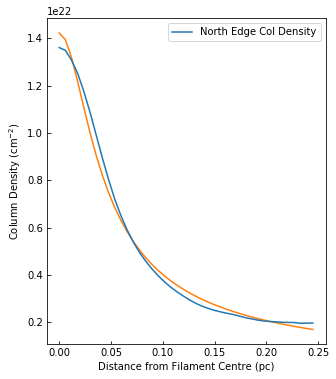

In [35]:
#Plot the fit

plt.figure(figsize=(5, 6))
plt.plot(r, profile, label='North Edge Col Density', zorder=3)
#plt.axhline(0, linestyle='--', color='black', alpha=0.5, zorder=2)
#plt.axhline(profile[-1], linestyle='--', color='red', alpha=0.5, label='Background Col Density', zorder=1)

plt.plot(r, plum(np.array((r.to(u.cm)/u.cm)), A_fit, nc_fit, Rf_fit)/u.cm**2)

plt.xlabel('Distance from Filament Centre (pc)')
plt.ylabel('Column Density (cm$^{-2}$)')
#plt.xlim(-0.000, 0.25)
#plt.ylim(-0.1e22, 1.5e22)
plt.legend()
plt.show()

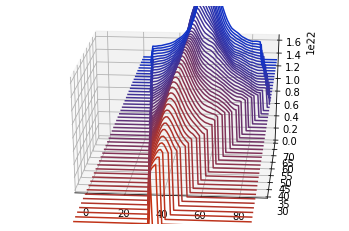

In [36]:
fig = plt.figure()
ax = plt.axes(projection='3d')
x = np.arange(0, colden_re_rot.shape[1])
n=0
for i in colden_re_rot[:50]:
    ax.plot3D(x, np.linspace(n, n, len(i)), i, color=(((160-n)/200), 0.2, ((n+10)/200)))
    n+=3
ax.set_ylim([30, 70])
ax.view_init(elev=25, azim=-85)

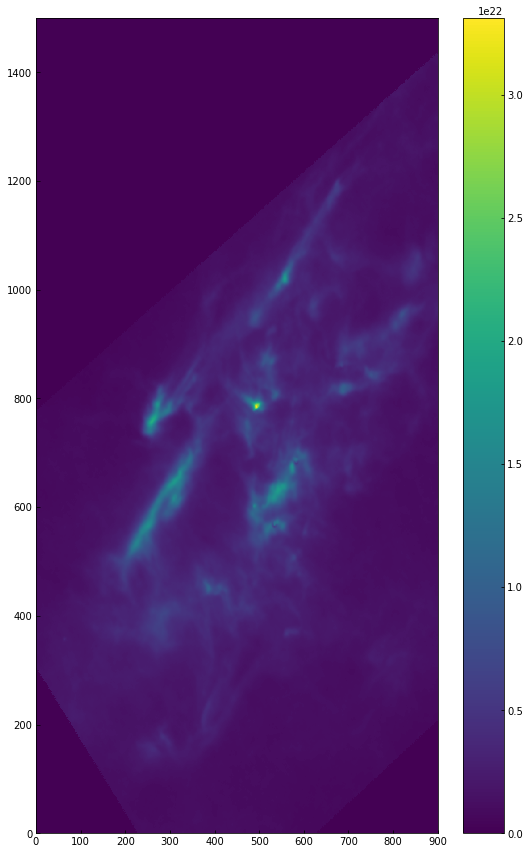

In [37]:
plt.figure(figsize=(9, 15))
plt.pcolormesh(colden_data[500:2000, 600:1500])
plt.colorbar()
plt.show()

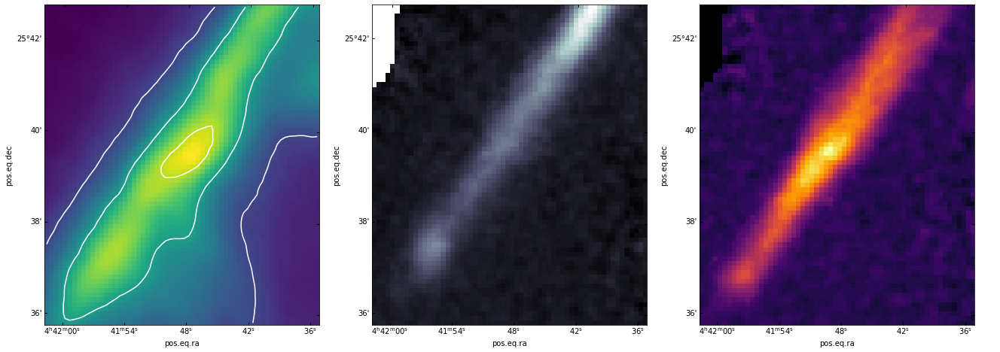

In [40]:
fig = plt.figure(figsize=(18,6), constrained_layout=True)

ax1 = fig.add_subplot(131, projection=tmc1.wcs)
im1 = ax1.imshow(colden_re,cmap='viridis')
ax1.contour(colden_re,levels=[5.e21,1.e22,1.5e22],colors='white')

ax2 = fig.add_subplot(132, projection=tmc1.wcs)
im2 = ax2.imshow(nh3_tmc1.data,cmap='bone')

ax3 = fig.add_subplot(133, projection=tmc1.wcs)
im3 = ax3.imshow(hc5n_tmc1.data,cmap='inferno')

plt.show()

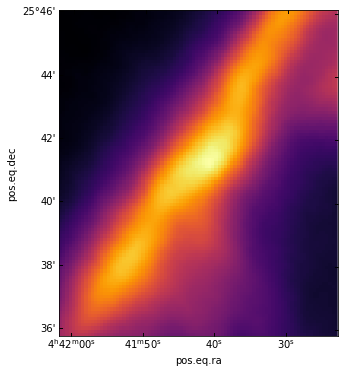

In [36]:
fig = plt.figure(figsize=(7, 6))
ax1 = fig.add_subplot(111, projection=tmc1.wcs)
im = ax1.imshow(tmc1.data,cmap='inferno')
#ax1.contour(tmc1.data,levels=[5.e21,1.e22,1.3e22],colors='white')#,transform=ax1.get_transform(wcsNH3))
#ax1.text(0.15,0.7,'N(H$_2$)',size=14,color='white',transform=ax1.transAxes)
#cbar = plt.colorbar(im,pad=0.06,orientation='horizontal')
#cbar.set_label('cm$^{-2}$')
#ra = ax1.coords[0]
#ra.set_major_formatter('hh:mm:ss')
#ra.set_separator(':')

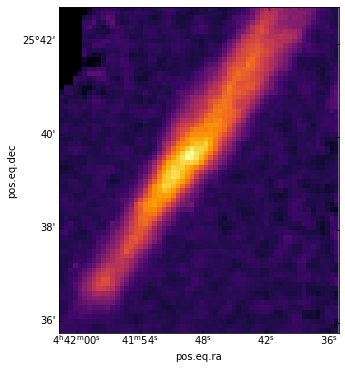

In [37]:
fig = plt.figure(figsize=(7, 6))
ax1 = fig.add_subplot(111, projection=tmc1.wcs)
im = ax1.imshow(hc5n_tmc1.data,cmap='inferno')

In [298]:
#np.sum(tmc1_hdu[0].data, axis=0)

In [48]:
n_ls_gt = n_ls_g1+n_ls_g2+n_ls_g3

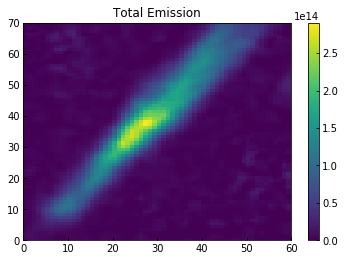

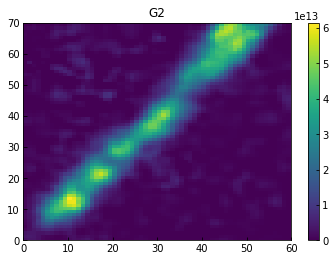

In [44]:
plt.pcolormesh(n_ls_gt)
plt.colorbar()
plt.title('Total Emission')
plt.show()
plt.pcolormesh(n_ls_g2)
plt.colorbar()
plt.title('G2')
plt.show()

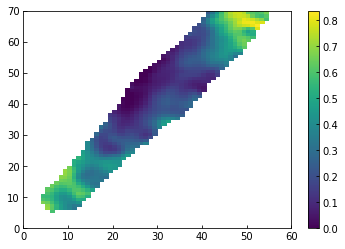

In [56]:
plt.pcolormesh(ls_gt*n_ls_g2/n_ls_gt)
plt.colorbar()

In [57]:
np.nanmean(ls_gt*n_ls_g2/n_ls_gt)

<Quantity 0.29486639>

### Find location of edges of hc5n data

In [54]:
data = ls_gt*n_ls_gt

hc5n_edges = []

for i in range(0, len(data)):
    
    pt_y = 0
    
    for j in range(0, len(data[0])):
        
        pt_x = 0
        
        if np.isnan(data[i][j]) == False:
            
            pt_x = j
            pt_y = i
            break
        else:
            
            continue
    
    hc5n_edges.append([pt_x, pt_y])
    

### Find location of edges of h2 data

In [55]:
re_mask = colden_re.data > 1.5*np.std(colden_re.data)
re_cover = np.empty(re_mask.shape)
re_cover.fill(np.nan)
re_cover[re_mask == True] = 1

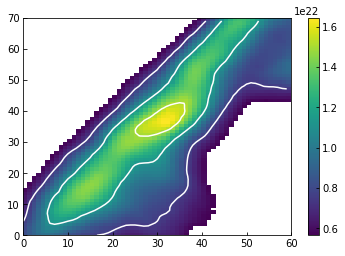

In [56]:
plt.pcolormesh(re_cover*colden_re)
plt.colorbar()
plt.contour(colden_re, colors='white', levels=[2*np.std(colden_re.data), 
                                               3*np.std(colden_re.data), 
                                               4*np.std(colden_re.data)])


Optical depth, flesh out the Che-yu calculation, pressure coming in from north edge, accreting material, back edge could be billowing out somewhat, paper about opacity

In [57]:
data = re_cover*colden_re.data
h2_edges = []
for i in range(0, len(data)):    
    pt_y = 0    
    for j in range(0, len(data[0])):        
        pt_x = 0        
        if np.isnan(data[i][j]) == False:            
            pt_x = j
            pt_y = i
            break
        else:            
            continue    
    h2_edges.append([pt_x, pt_y])

In [58]:
h2_box = np.zeros(colden_re.data.shape)
for i in h2_edges[:]:
    n = 31
    tot = (i[0]+n) 
    if tot > 60:
        n = 60-i[0]
    for j in range(0, n):
        h2_box[i[1]][i[0]+j] = 1

h2_box2 = np.zeros(colden_re.data.shape)
for i in h2_edges:
    n = 42
    diff = (i[1]-n)
    if diff < 0:
        n = i[1]+1
    for j in range(0, n):
        h2_box2[i[1]-j][i[0]] = 1
        
first_half = (h2_box2[:, :35]*h2_box[:, :35])
second_half = (h2_box[:, 35:])

total_h2_box = []
for i in range(0, 70):
    total_h2_box.append(np.array(first_half[i].tolist() + second_half[i].tolist()))
    
total_h2_box = np.array(total_h2_box)

box_mask = np.empty(total_h2_box.shape)
box_mask.fill(np.nan)
box_mask[total_h2_box == True] = 1

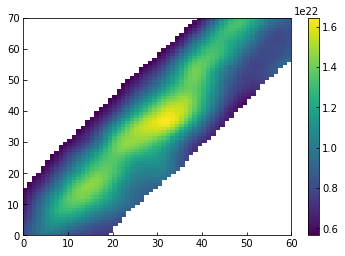

In [59]:
plt.pcolormesh(box_mask*colden_re)
plt.colorbar()
plt.show()

In [60]:
(re_cover*colden_re)[40][17], (re_cover*colden_re)[40][48]
h2_box[68][38], h2_box[28][38]

(1.0, 1.0)

### Find Edges of the Box

In [61]:
data = box_mask*colden_re.data
box_edges = []
for i in range(0, len(data)):    
    pt_y = 0    
    for j in range(0, len(data[0])):        
        pt_x = 0        
        if np.isnan(data[i][j]) == False:            
            pt_x = j
            pt_y = i
            break
        else:            
            continue    
    box_edges.append([pt_x, pt_y])

### Velocity Dispersions

In [32]:
cs, Vrms

(<Quantity 0.1844002 km / s>, <Quantity 0.03260513 km / s>)

/Users/simonsmith/anaconda3/lib/python3.6/site-packages/astropy/units/quantity.py:477: RuntimeWarning: invalid value encountered in sqrt
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


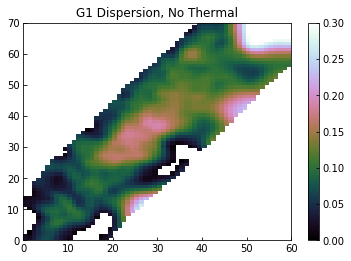

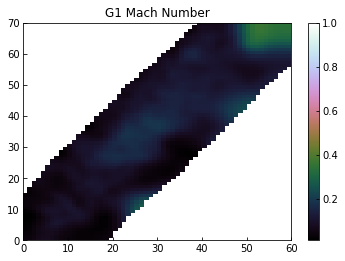

In [76]:
g1_notherm = np.sqrt((g1_dispersion*u.km/u.s)**2 - Vrms**2)
g1_notherm/cs

plt.pcolormesh(box_mask*g1_notherm, cmap='cubehelix', vmin=0, vmax=0.3)
plt.colorbar()
#plt.contour(g1_intensity, colors='white')
plt.title('G1 Dispersion, No Thermal')
plt.show()
plt.pcolormesh(box_mask*g1_dispersion, cmap='cubehelix', vmax=1)
plt.colorbar()
plt.title('G1 Mach Number')
plt.show()

/Users/simonsmith/anaconda3/lib/python3.6/site-packages/astropy/units/quantity.py:477: RuntimeWarning: invalid value encountered in sqrt
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


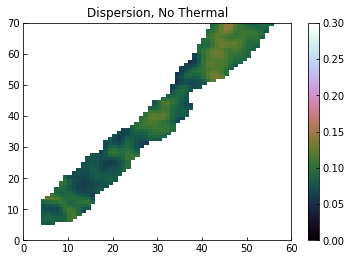

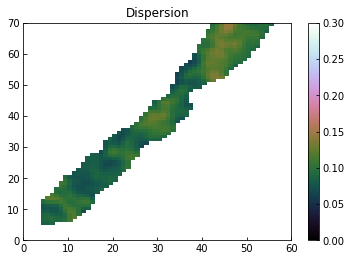

In [247]:
g2_notherm = np.sqrt((g2_dispersion*u.km/u.s)**2 - Vmrs**2)

plt.pcolormesh(ls_g2*g2_notherm, cmap='cubehelix', vmin=0, vmax=0.3)
plt.colorbar()
plt.title('Dispersion, No Thermal')
plt.show()
plt.pcolormesh(ls_g2*g2_dispersion, cmap='cubehelix', vmin=0, vmax=0.3)
plt.colorbar()
plt.title('Dispersion')
plt.show()

/Users/simonsmith/anaconda3/lib/python3.6/site-packages/astropy/units/quantity.py:477: RuntimeWarning: invalid value encountered in sqrt
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


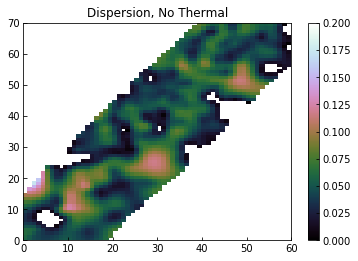

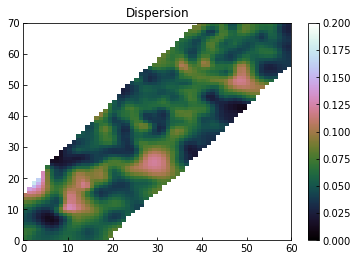

In [248]:
g3_notherm = np.sqrt((g3_dispersion*u.km/u.s)**2 - Vmrs**2)

plt.pcolormesh(box_mask*g3_notherm, cmap='cubehelix', vmin=0, vmax=0.20)
plt.colorbar()
plt.title('Dispersion, No Thermal')
plt.show()
plt.pcolormesh(box_mask*g3_dispersion, cmap='cubehelix', vmin=0, vmax=0.20)
plt.colorbar()
plt.title('Dispersion')
plt.show()

### For Average Velocity Profiles, REDO in the Kinematics section

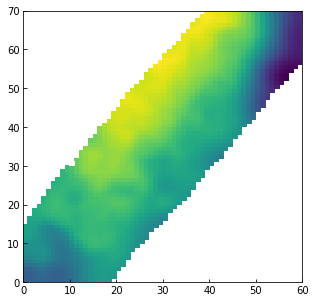

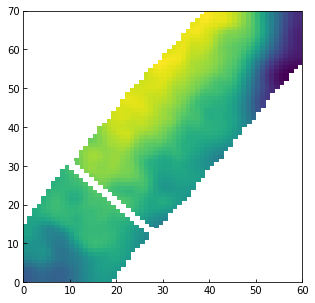

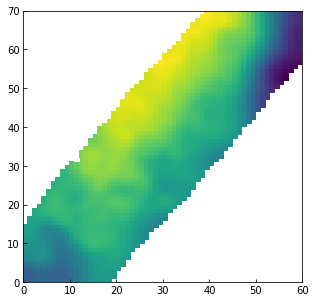

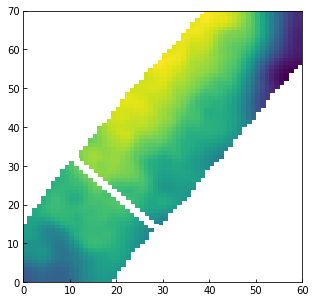

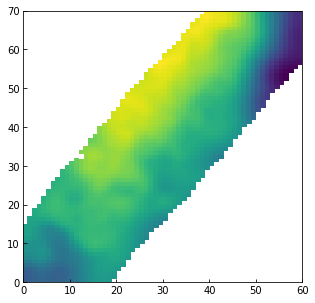

...

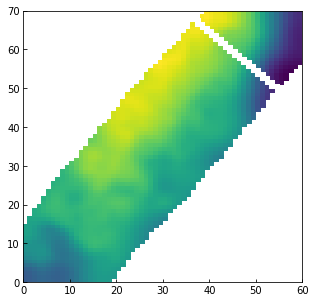

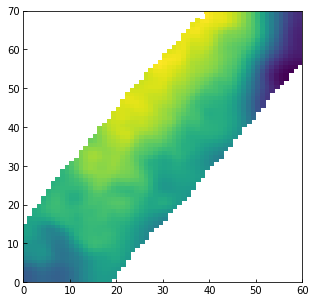

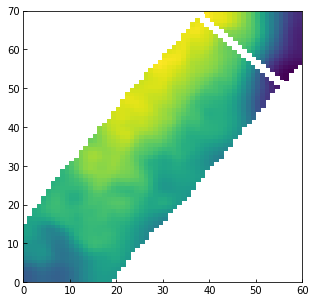

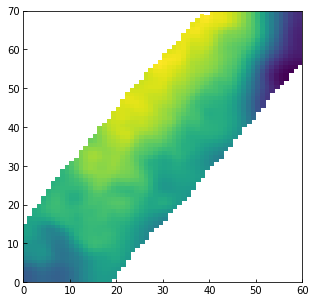

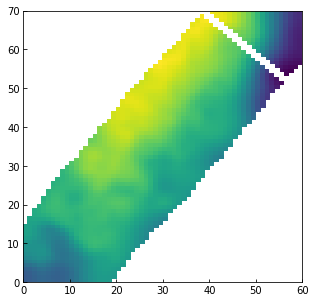

In [63]:
g1_grads = []
for i in box_edges[30:]:
    grad = r_mod.line_dec_inst(i, box_mask*g1_velocity, -1)
    g1_grads.append(grad)

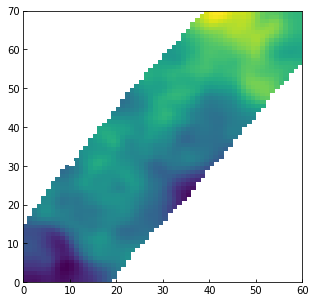

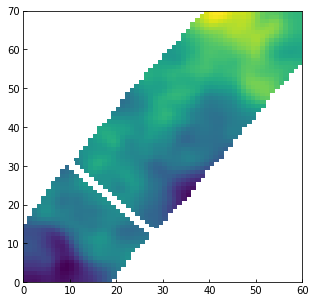

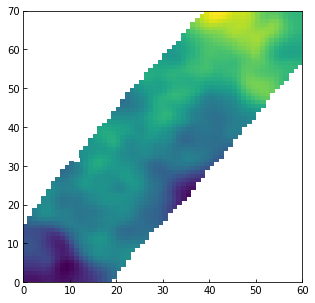

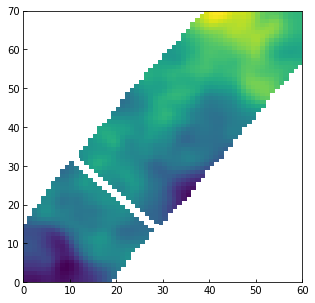

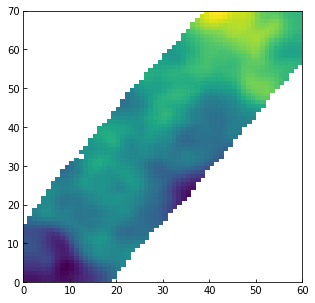

...

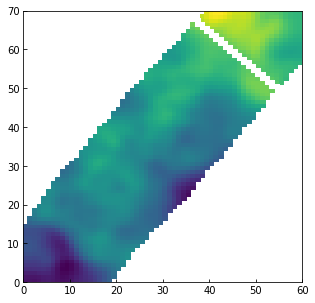

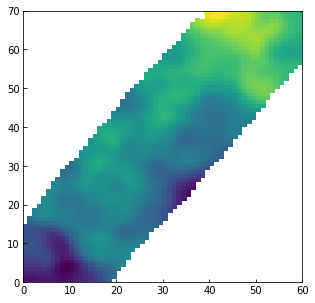

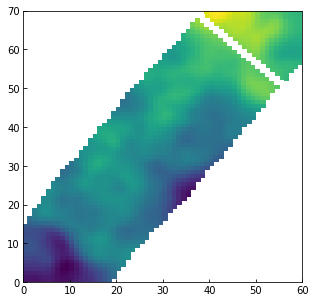

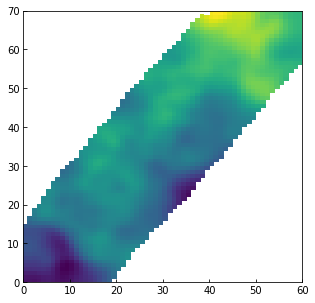

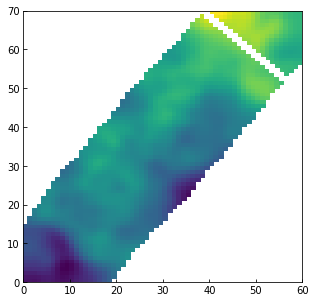

In [64]:
g2_grads = []
for i in box_edges[30:]:
    grad = r_mod.line_dec_inst(i, box_mask*g2_velocity, -1)
    g2_grads.append(grad)

In [67]:
for i in range(0, len(g1_grads)):
    g1_grads[i] = line_comb(g1_grads[i]).tolist()
    g2_grads[i] = line_comb(g2_grads[i]).tolist()

In [68]:
g1_vel_profiles = []
g2_vel_profiles = []

for i in range(0, len(g1_grads)):
    temp_g1 = g1_grads[i]
    temp_g2 = g2_grads[i]

    xnan = 37 - len(temp_g2)
    if xnan > 0:
        for i in range(0, xnan):
            temp_g1.append(np.nan)
            temp_g2.append(np.nan)
    temp_g1 = np.array(temp_g1)
    temp_g2 = np.array(temp_g2)
    g1_vel_profiles.append(temp_g1)
    g2_vel_profiles.append(temp_g2)
g1_vel_profiles = np.array(g1_vel_profiles)
g2_vel_profiles = np.array(g2_vel_profiles)

/Users/simonsmith/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: Mean of empty slice
  """Entry point for launching an IPython kernel.
/Users/simonsmith/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/Users/simonsmith/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


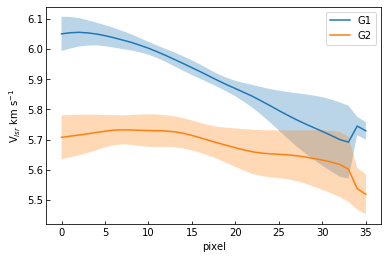

In [93]:
g1_profile = np.nanmean(g1_vel_profiles, axis=0)
g2_profile = np.nanmean(g2_vel_profiles, axis=0)
g1_std = np.nanstd(g1_vel_profiles, axis=0)
g2_std = np.nanstd(g2_vel_profiles, axis=0)

x = np.arange(0, len(g1_profile))

plt.plot(x, g1_profile, label='G1')
plt.fill_between(x, g1_profile+g1_std, 
                 g1_profile-g1_std, alpha=0.3)
plt.plot(x, g2_profile, label='G2')
plt.fill_between(x, g2_profile+g2_std, 
                 g2_profile-g2_std, alpha=0.3)
plt.ylabel('V$_{lsr}$ km s$^{-1}$')
plt.xlabel('pixel')
plt.legend()
plt.show()

### For comparing densities

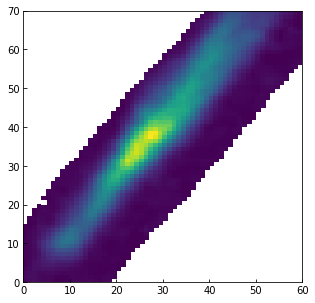

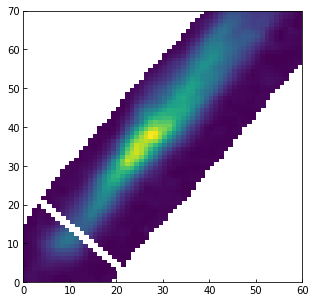

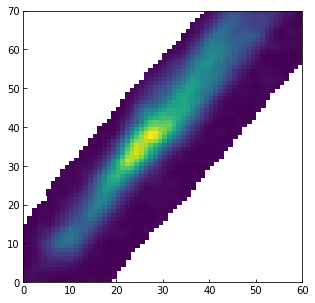

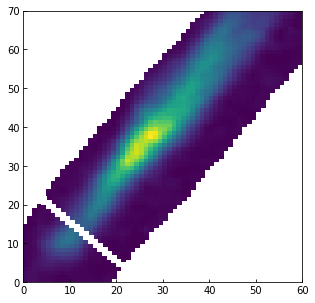

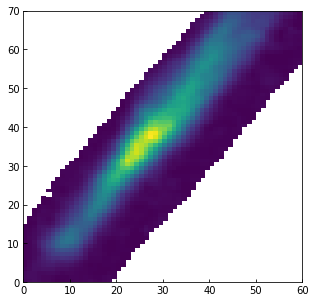

...

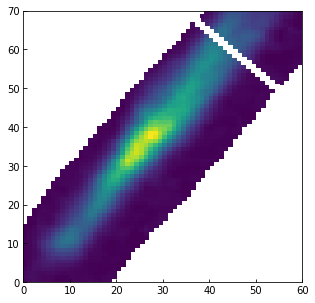

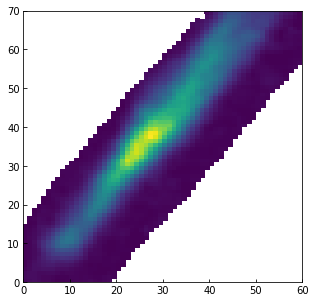

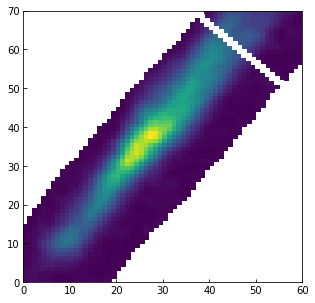

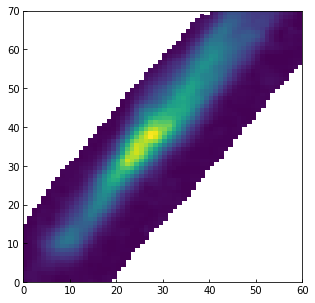

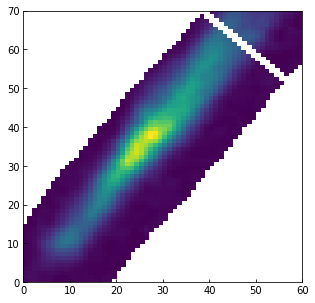

In [33]:
strips = []
for i in box_edges[20:]:
    strip = r_mod.line_dec_inst(i, box_mask*n_ls_gt, -1)
    strips.append(strip)

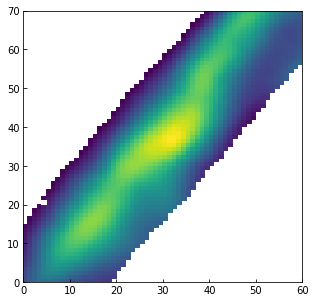

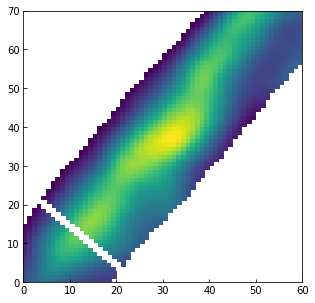

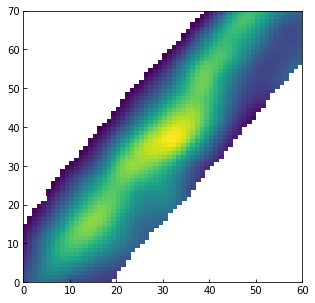

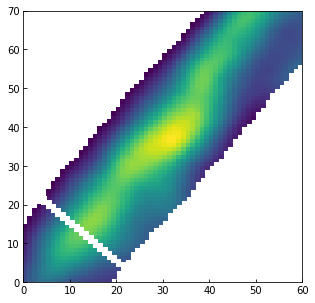

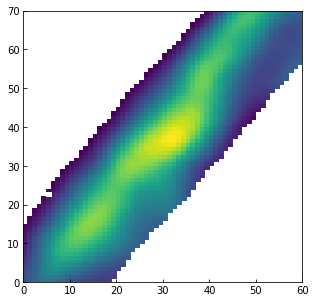

...

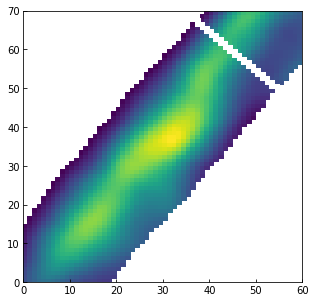

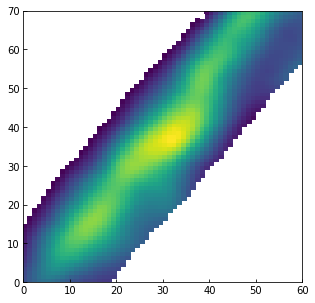

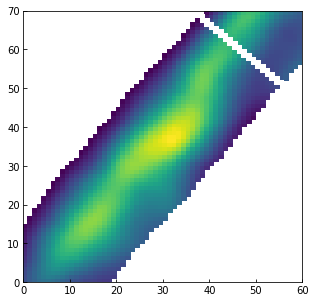

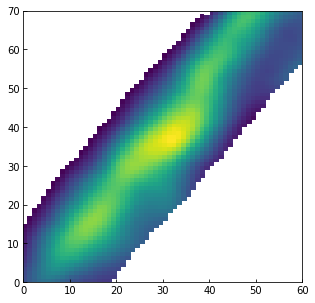

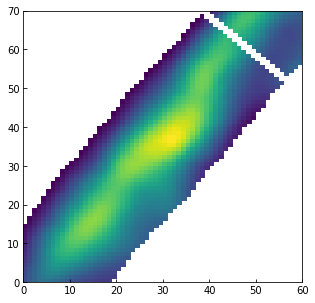

In [34]:
strips_2 = []
for i in box_edges[20:]:
    strip_2 = r_mod.line_dec_inst(i, box_mask*colden_re, -1)
    strips_2.append(strip_2)

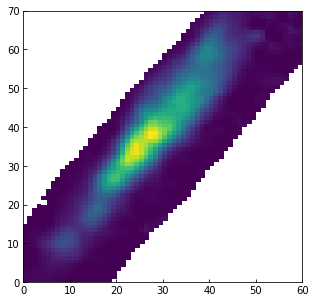

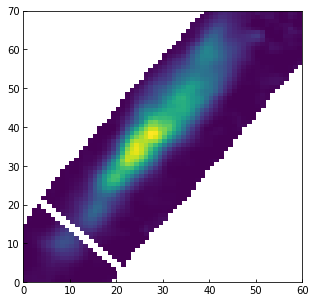

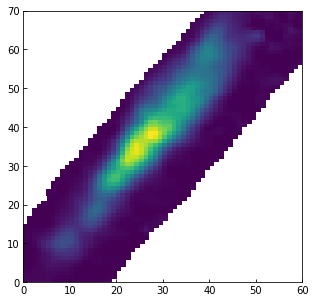

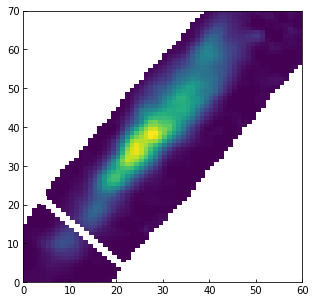

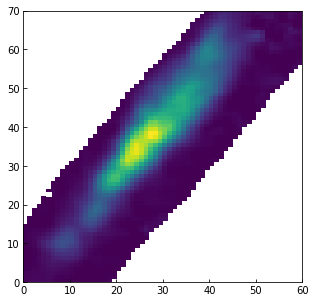

...

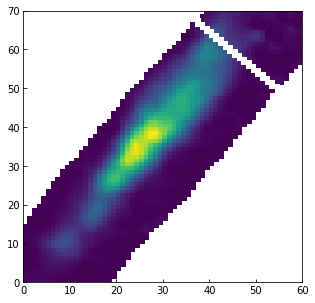

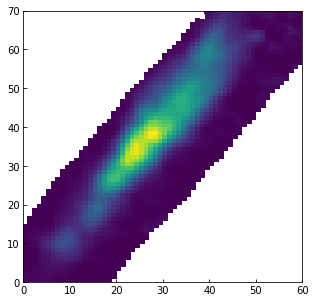

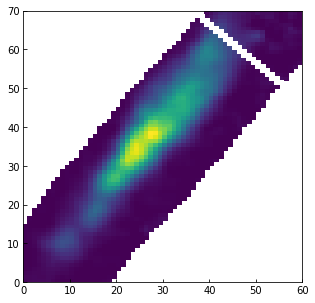

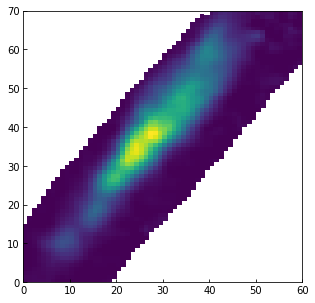

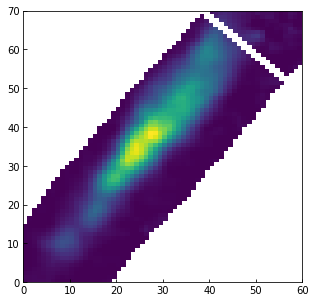

In [35]:
strips_g1 = []
for i in box_edges[20:]:
    strip_g1 = r_mod.line_dec_inst(i, box_mask*n_ls_g1, -1)
    strips_g1.append(strip_g1)

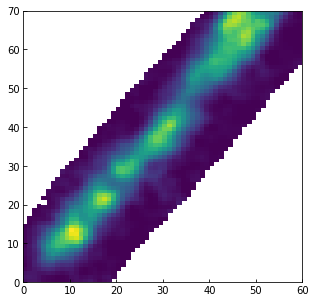

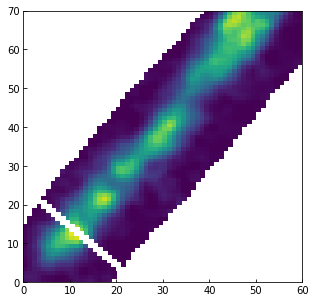

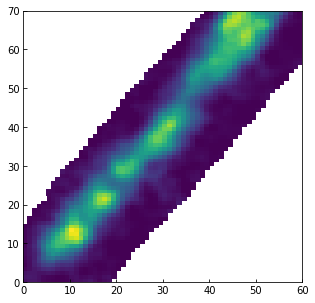

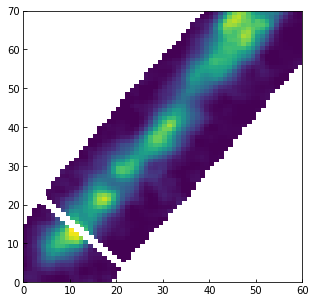

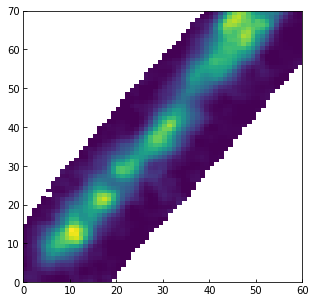

...

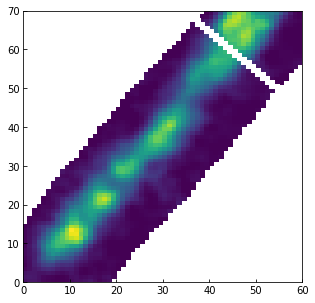

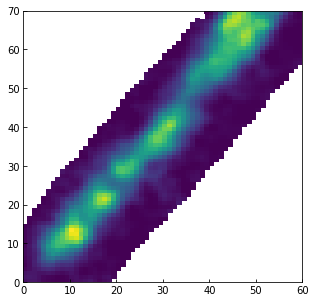

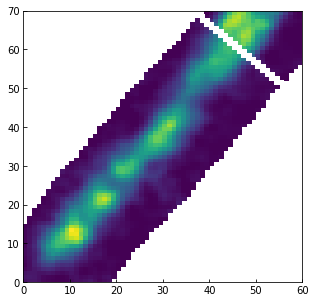

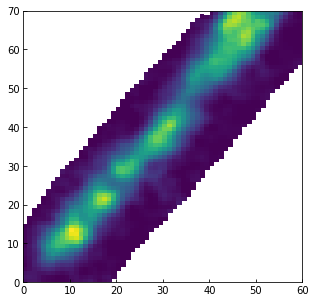

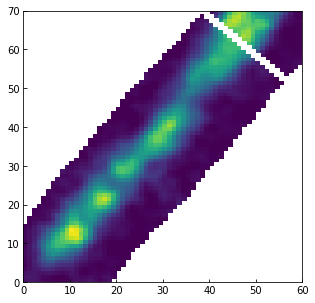

In [36]:
strips_g2 = []
for i in box_edges[20:]:
    strip_g2 = r_mod.line_dec_inst(i, box_mask*n_ls_g2, -1)
    strips_g2.append(strip_g2)

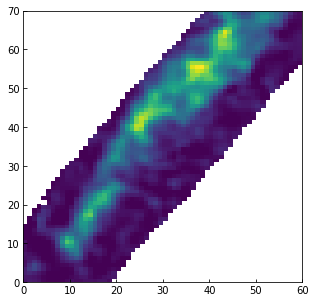

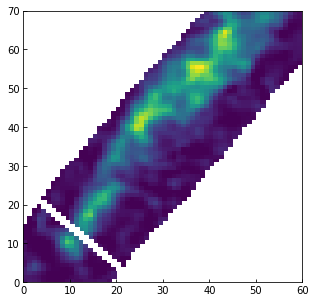

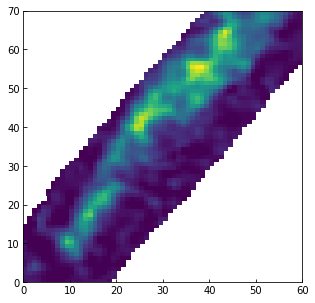

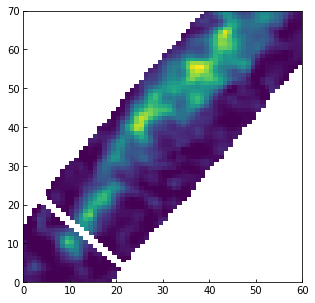

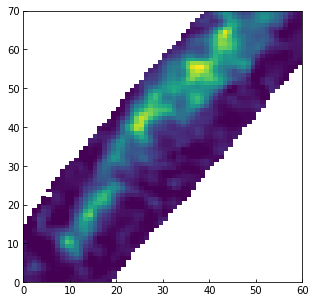

...

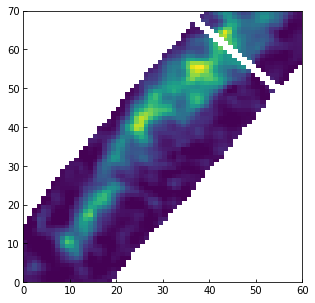

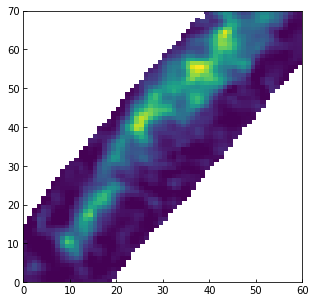

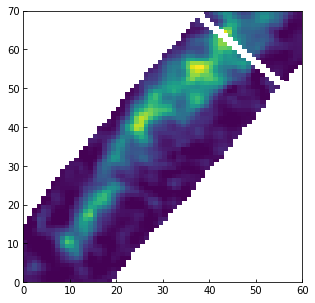

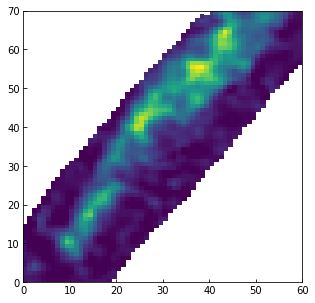

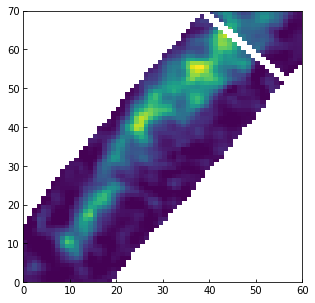

In [37]:
strips_g3 = []
for i in box_edges[20:]:
    strip_g3 = r_mod.line_dec_inst(i, box_mask*n_ls_g3, -1)
    strips_g3.append(strip_g3)

34


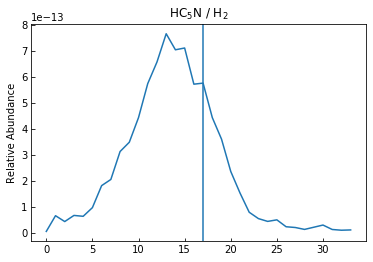

35


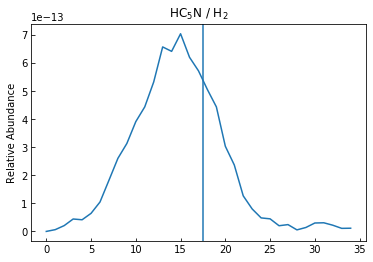

35


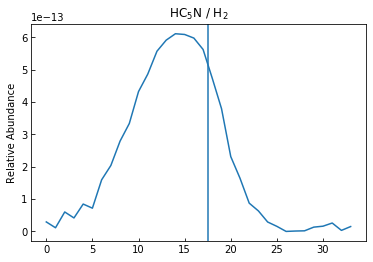

35


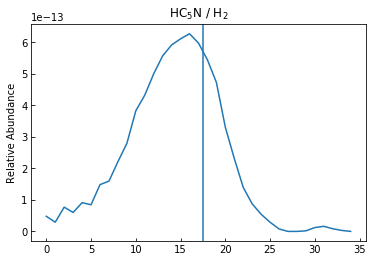

35


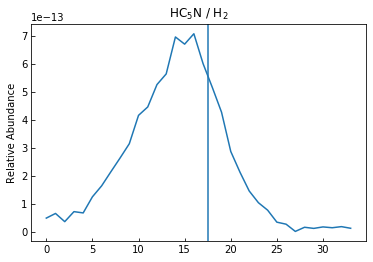

35


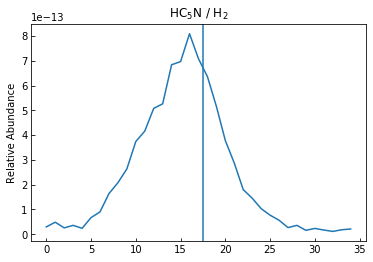

35


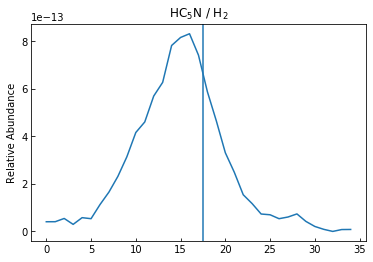

35


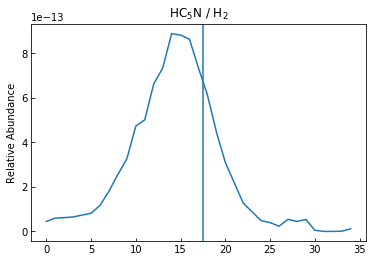

36


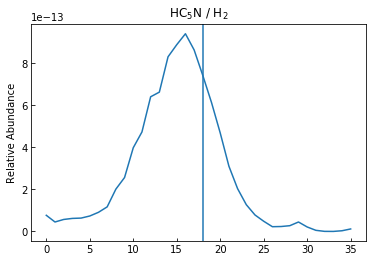

35


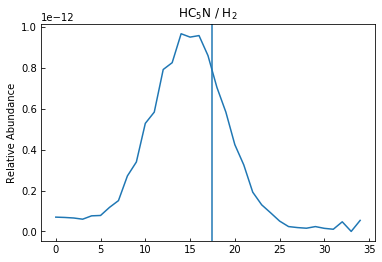

35


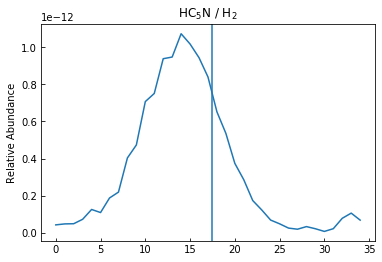

35


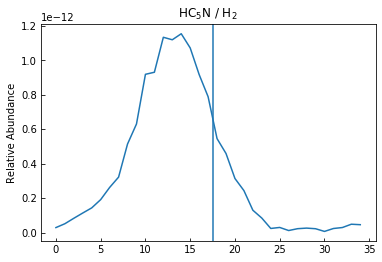

35


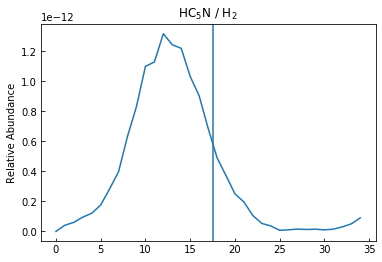

36


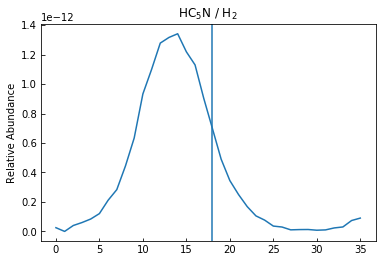

35


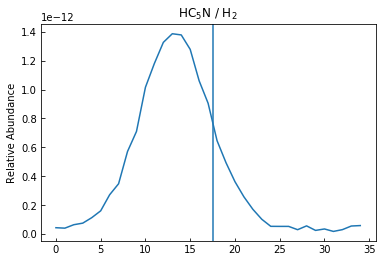

35


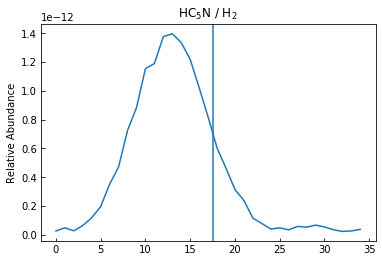

36


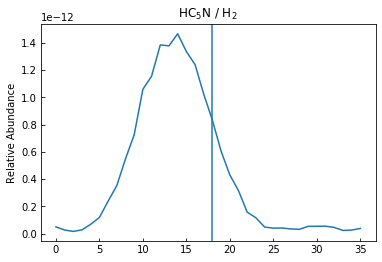

36


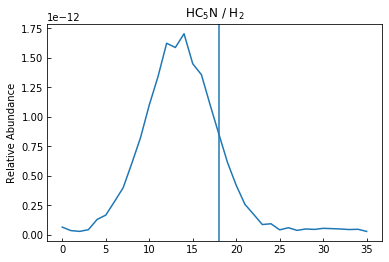

36


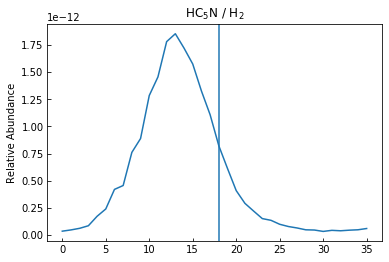

37


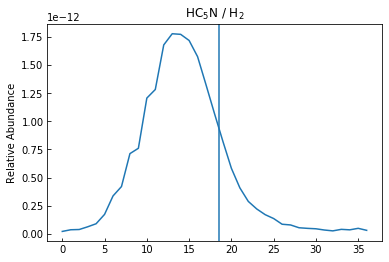

37


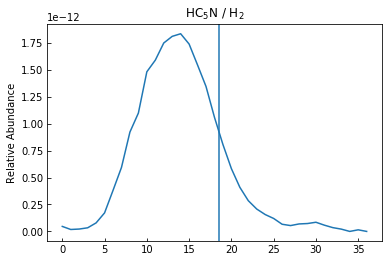

37


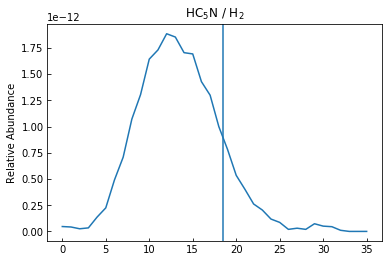

35


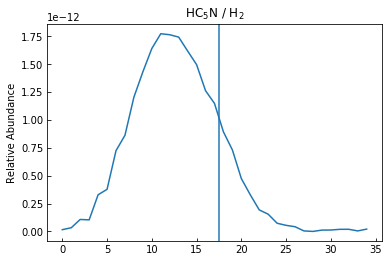

37


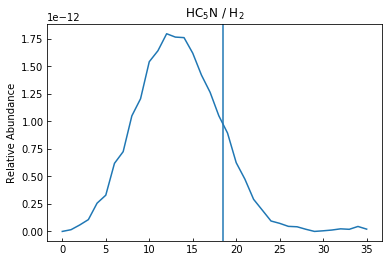

36


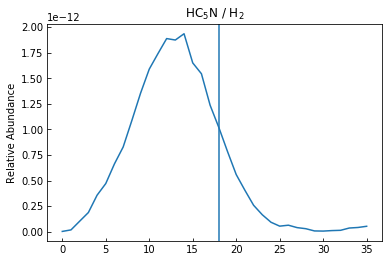

35


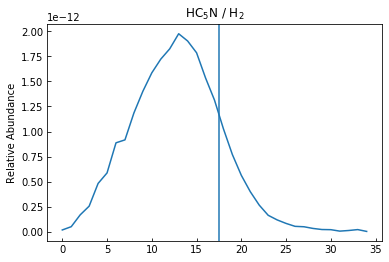

37


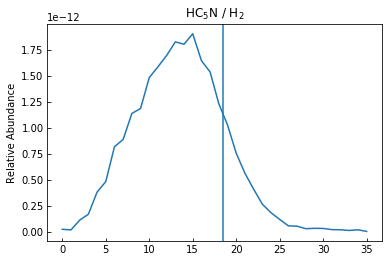

36


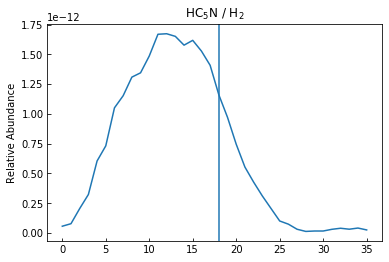

37


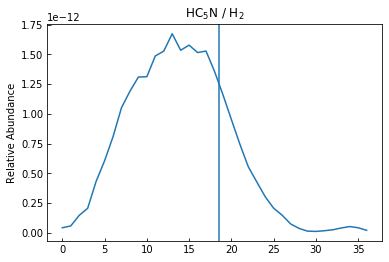

37


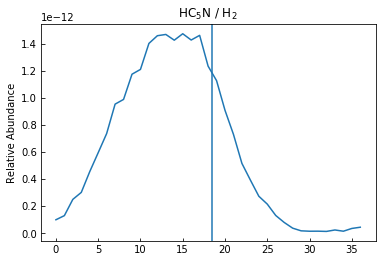

37


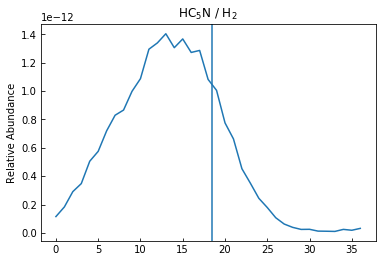

37


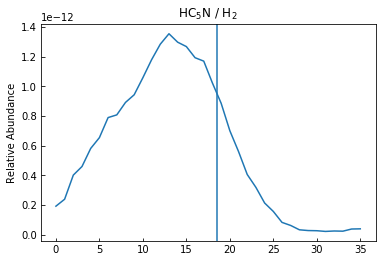

36


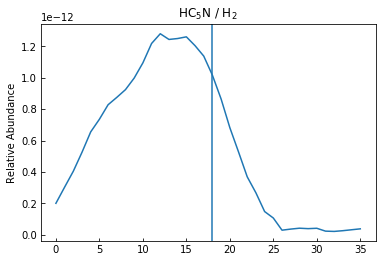

37


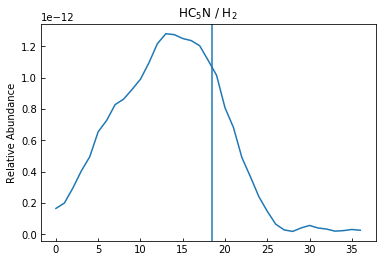

37


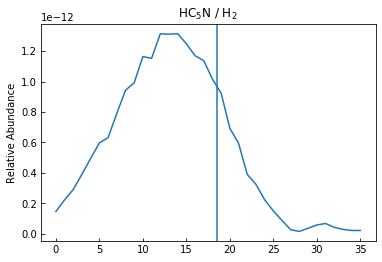

36


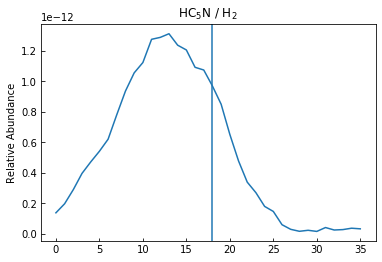

35


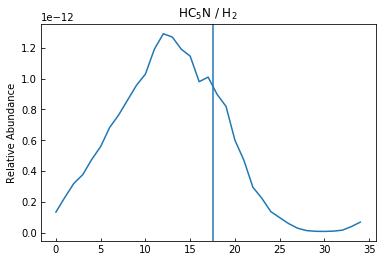

35


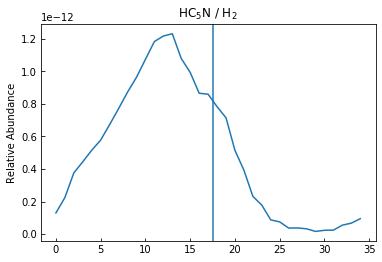

36


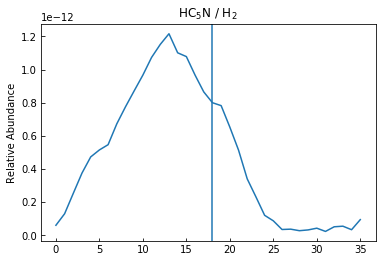

36


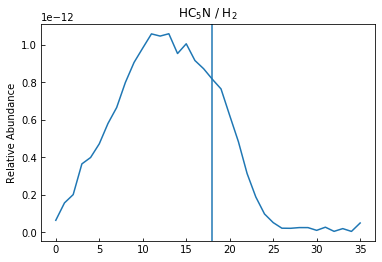

35


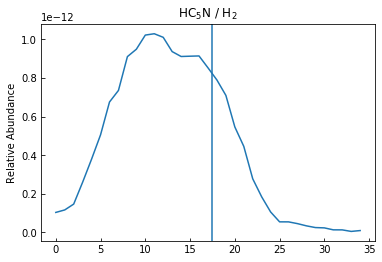

35


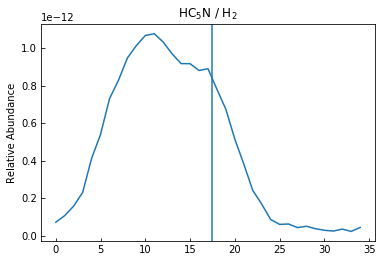

35


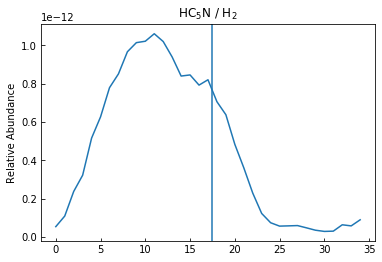

35


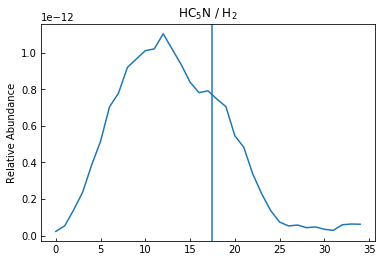

35


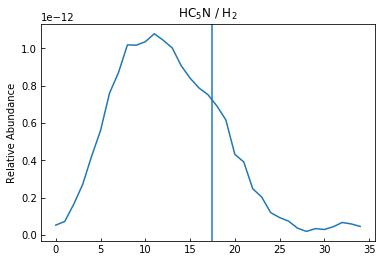

35


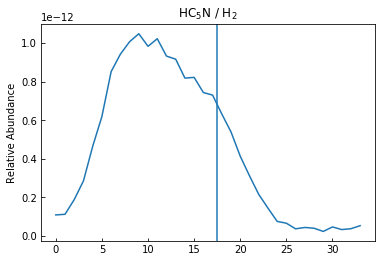

35


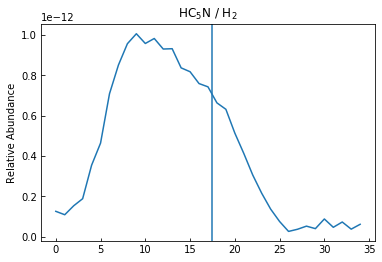

35


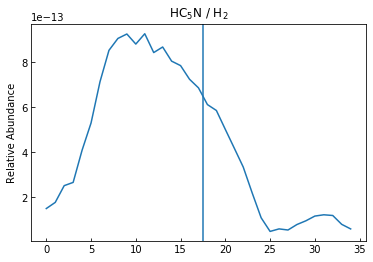

35


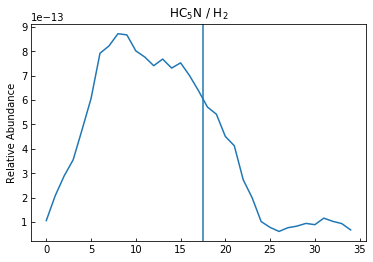

35


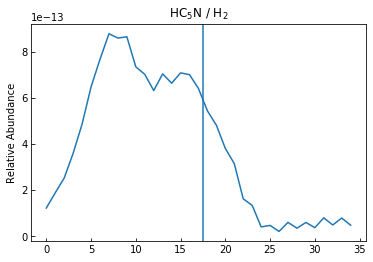

In [411]:
for i in range(0, len(strips)):
    
    plt.plot(np.array(strips[i])/(np.array(strips_2[i])/u.cm**2).decompose())
    plt.axvline(len(strips[i])/2)
    plt.ylabel('Relative Abundance')
    plt.title('HC$_5$N / H$_2$')
    print(len(strips[i]))
    plt.show()

In [40]:
for i in range(0, len(strips)):
    strips[i] = line_comb(strips[i])
    strips_2[i] = line_comb(strips_2[i])
    strips_g1[i] = line_comb(strips_g1[i])
    strips_g2[i] = line_comb(strips_g2[i])
    strips_g3[i] = line_comb(strips_g3[i])

In [41]:
for i in range(0, len(strips)):
    strips[i] = strips[i].tolist()
    strips_2[i] = strips_2[i].tolist()
    strips_g1[i] = strips_g1[i].tolist()
    strips_g2[i] = strips_g2[i].tolist()
    strips_g3[i] = strips_g3[i].tolist()

In [42]:
#DONT RUN AGAIN

hc5n_den_profiles = []
h2_den_profiles = []

for i in range(0, len(strips)):
    temp_hc5n = strips[i]
    temp_h2 = strips_2[i]

    xnan = 37 - len(temp_h2)
    if xnan > 0:
        for i in range(0, xnan):
            temp_hc5n.append(np.nan)
            temp_h2.append(np.nan)
    temp_hc5n = np.array(temp_hc5n)
    temp_h2 = np.array(temp_h2)
    hc5n_den_profiles.append(temp_hc5n)
    h2_den_profiles.append(temp_h2)
hc5n_den_profiles = np.array(hc5n_den_profiles)
h2_den_profiles = np.array(h2_den_profiles)

In [43]:
#DONT RUN AGAIN

g1_den_profiles = []
g2_den_profiles = []
g3_den_profiles = []

for i in range(0, len(strips_g1)):
    temp_g1 = strips_g1[i]
    temp_g2 = strips_g2[i]
    temp_g3 = strips_g3[i]
    
    xnan = 37 - len(temp_g1)
    if xnan > 0:
        for i in range(0, xnan):
            temp_g1.append(np.nan)
            temp_g2.append(np.nan)
            temp_g3.append(np.nan)
    temp_g1 = np.array(temp_g1)
    temp_g2 = np.array(temp_g2)
    temp_g3 = np.array(temp_g3)
    
    g1_den_profiles.append(temp_g1)
    g2_den_profiles.append(temp_g2)
    g3_den_profiles.append(temp_g3)
    
g1_den_profiles = np.array(g1_den_profiles)
g2_den_profiles = np.array(g2_den_profiles)
g3_den_profiles = np.array(g3_den_profiles)

In [44]:
h2_den_normed = []
for i in h2_den_profiles:
    h2_den_normed.append(i/np.nanmax(i))
h2_den_normed = np.array(h2_den_normed)


hc5n_den_normed = []
for i in hc5n_den_profiles:
    hc5n_den_normed.append(i/np.nanmax(i))
hc5n_den_normed = np.array(hc5n_den_normed)


ratio_den_normed = []
for i in range(0, len(h2_den_profiles)):
    temp = hc5n_den_profiles[i]/h2_den_profiles[i]
    ratio_den_normed.append(temp/np.nanmax(temp))
ratio_den_normed = np.array(ratio_den_normed)

In [45]:
g1_den_normed = []
for i in g1_den_profiles:
    g1_den_normed.append(i/np.nanmax(i))
g1_den_normed = np.array(g1_den_normed)
g2_den_normed = []
for i in g2_den_profiles:
    g2_den_normed.append(i/np.nanmax(i))
g2_den_normed = np.array(g2_den_normed)
g3_den_normed = []
for i in g3_den_profiles:
    g3_den_normed.append(i/np.nanmax(i))
g3_den_normed = np.array(g3_den_normed)

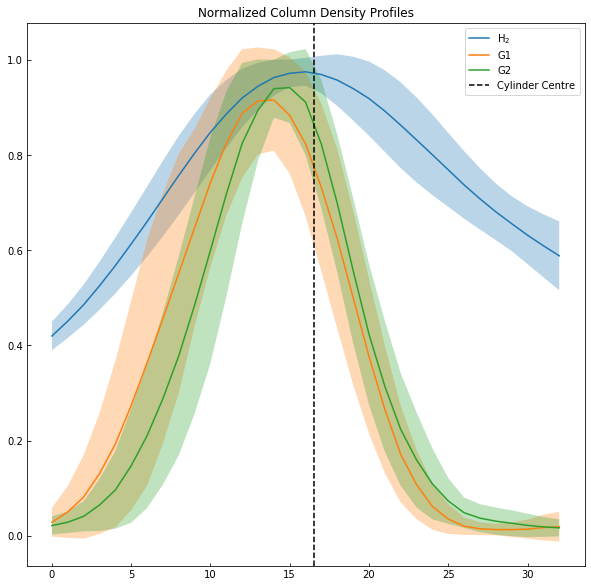

In [46]:


h2_mean = np.mean(h2_den_normed, axis=0)
h2_std = np.std(h2_den_normed, axis=0)
hc5n_mean = np.mean(hc5n_den_normed, axis=0)
hc5n_std = np.std(hc5n_den_normed, axis=0)

x = np.arange(0, len(h2_mean))

g1_mean = np.mean(g1_den_normed, axis=0)
g1_std = np.std(g1_den_normed, axis=0)
g2_mean = np.mean(g2_den_normed, axis=0)
g2_std = np.std(g2_den_normed, axis=0)
g3_mean = np.mean(g3_den_normed, axis=0)
g3_std = np.std(g3_den_normed, axis=0)

plt.figure(figsize=(10, 10))
plt.plot(x, h2_mean, label='H$_2$')
plt.fill_between(x, h2_mean+h2_std, h2_mean-h2_std, alpha=0.3)
'''
plt.plot(x, hc5n_mean, label='HC$_5$N')
plt.fill_between(x, hc5n_mean+hc5n_std, hc5n_mean-hc5n_std, alpha=0.3)
'''
plt.plot(x, g1_mean, label='G1')
plt.fill_between(x, g1_mean+g1_std, g1_mean-g1_std, alpha=0.3)

plt.plot(x, g2_mean, label='G2')
plt.fill_between(x, g2_mean+g2_std, g2_mean-g2_std, alpha=0.3)
'''
plt.plot(x, g3_mean, label='G3')
plt.fill_between(x, g3_mean+g3_std, g3_mean-g3_std, alpha=0.3)
'''
plt.axvline(len(h2_mean)/2-2, linestyle='--', label='Cylinder Centre', color='k')
plt.legend()
plt.title('Normalized Column Density Profiles')
plt.show()

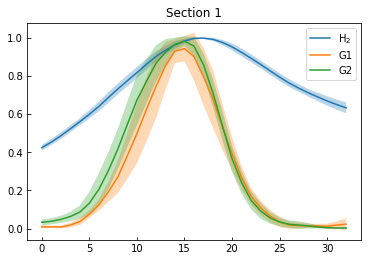

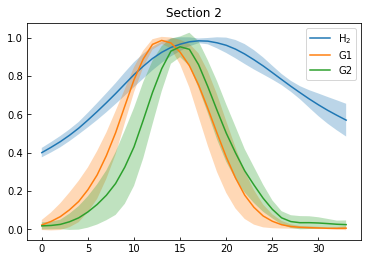

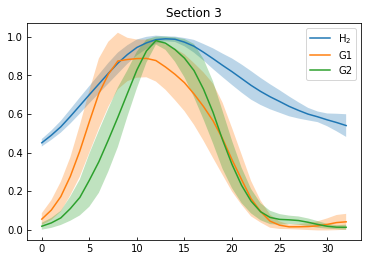

In [47]:
s1_h2 = h2_den_normed[:12]
s2_h2 = h2_den_normed[12:36]
s3_h2 = h2_den_normed[36:]

s1_h2_mean = np.mean(s1_h2, axis=0)
s1_h2_std = np.std(s1_h2, axis=0)
s2_h2_mean = np.mean(s2_h2, axis=0)
s2_h2_std = np.std(s2_h2, axis=0)
s3_h2_mean = np.mean(s3_h2, axis=0)
s3_h2_std = np.std(s3_h2, axis=0)


s1_hc5n = hc5n_den_normed[:12]
s2_hc5n = hc5n_den_normed[12:36]
s3_hc5n = hc5n_den_normed[36:]

s1_hc5n_mean = np.mean(s1_hc5n, axis=0)
s1_hc5n_std = np.std(s1_hc5n, axis=0)
s2_hc5n_mean = np.mean(s2_hc5n, axis=0)
s2_hc5n_std = np.std(s2_hc5n, axis=0)
s3_hc5n_mean = np.mean(s3_hc5n, axis=0)
s3_hc5n_std = np.std(s3_hc5n, axis=0)


s1_g1 = g1_den_normed[:12]
s2_g1 = g1_den_normed[12:36]
s3_g1 = g1_den_normed[36:]

s1_g1_mean = np.mean(s1_g1, axis=0)
s1_g1_std = np.std(s1_g1, axis=0)
s2_g1_mean = np.mean(s2_g1, axis=0)
s2_g1_std = np.std(s2_g1, axis=0)
s3_g1_mean = np.mean(s3_g1, axis=0)
s3_g1_std = np.std(s3_g1, axis=0)


s1_g2 = g2_den_normed[:12]
s2_g2 = g2_den_normed[12:36]
s3_g2 = g2_den_normed[36:]

s1_g2_mean = np.mean(s1_g2, axis=0)
s1_g2_std = np.std(s1_g2, axis=0)
s2_g2_mean = np.mean(s2_g2, axis=0)
s2_g2_std = np.std(s2_g2, axis=0)
s3_g2_mean = np.mean(s3_g2, axis=0)
s3_g2_std = np.std(s3_g2, axis=0)


s1_g3 = g3_den_normed[:12]
s2_g3 = g3_den_normed[12:36]
s3_g3 = g3_den_normed[36:]

s1_g3_mean = np.mean(s1_g3, axis=0)
s1_g3_std = np.std(s1_g3, axis=0)
s2_g3_mean = np.mean(s2_g3, axis=0)
s2_g3_std = np.std(s2_g3, axis=0)
s3_g3_mean = np.mean(s3_g3, axis=0)
s3_g3_std = np.std(s3_g3, axis=0)







s1_x = np.arange(0, len(s1_h2_mean))
plt.plot(s1_x, s1_h2_mean, label='H$_2$')
plt.fill_between(s1_x, s1_h2_mean+s1_h2_std,
                s1_h2_mean-s1_h2_std, 
                alpha=0.3)
'''
plt.plot(s1_x, s1_hc5n_mean, label='HC$_5$N')
plt.fill_between(s1_x, s1_hc5n_mean+s1_hc5n_std,
                s1_hc5n_mean-s1_hc5n_std, 
                alpha=0.3)
'''
plt.plot(s1_x, s1_g1_mean, label='G1')
plt.fill_between(s1_x, s1_g1_mean+s1_g1_std,
                s1_g1_mean-s1_g1_std, 
                alpha=0.3)
plt.plot(s1_x, s1_g2_mean, label='G2')
plt.fill_between(s1_x, s1_g2_mean+s1_g2_std,
                s1_g2_mean-s1_g2_std, 
                alpha=0.3)
plt.title('Section 1')
plt.legend()
plt.show()





s2_x = np.arange(0, len(s2_h2_mean))
plt.plot(s2_x, s2_h2_mean, label='H$_2$')
plt.fill_between(s2_x, s2_h2_mean+s2_h2_std,
                s2_h2_mean-s2_h2_std, 
                alpha=0.3)
'''
plt.plot(s2_x, s2_hc5n_mean, label='HC$_5$N')
plt.fill_between(s2_x, s2_hc5n_mean+s2_hc5n_std,
                s2_hc5n_mean-s2_hc5n_std, 
                alpha=0.3)
'''
plt.plot(s2_x, s2_g1_mean, label='G1')
plt.fill_between(s2_x, s2_g1_mean+s2_g1_std,
                s2_g1_mean-s2_g1_std, 
                alpha=0.3)
plt.plot(s2_x, s2_g2_mean, label='G2')
plt.fill_between(s2_x, s2_g2_mean+s2_g2_std,
                s2_g2_mean-s2_g2_std, 
                alpha=0.3)
plt.title('Section 2')
plt.legend()
plt.show()




s3_x = np.arange(0, len(s3_h2_mean))
plt.plot(s3_x, s3_h2_mean, label='H$_2$')
plt.fill_between(s3_x, s3_h2_mean+s3_h2_std,
                s3_h2_mean-s3_h2_std, 
                alpha=0.3)
'''
plt.plot(s3_x, s3_hc5n_mean, label='HC$_5$N')
plt.fill_between(s3_x, s3_hc5n_mean+s3_hc5n_std,
                s3_hc5n_mean-s3_hc5n_std, 
                alpha=0.3)
'''
plt.plot(s3_x, s3_g1_mean, label='G1')
plt.fill_between(s3_x, s3_g1_mean+s3_g1_std,
                s3_g1_mean-s3_g1_std, 
                alpha=0.3)
plt.plot(s3_x, s3_g2_mean, label='G2')
plt.fill_between(s3_x, s3_g2_mean+s3_g2_std,
                s3_g2_mean-s3_g2_std, 
                alpha=0.3)
plt.title('Section 3')
plt.legend()
plt.show()


In [66]:
def gauss(x, amp, cen, wid):
    """
    Initialize a gaussian function
    
    """
    if wid == 0:
        wid = 1
    else:
        wid = wid
        
    return amp * np.exp(-(x-cen)**2 / wid)

def fit_gauss(spec):
    stop = -1
    for i in range(0, len(spec)):
        if np.isnan(spec[i]):
            stop = i
            break
    
    spec = spec[:stop]
    
    x = np.arange(0, len(spec))
    
    init_vals = [np.max(spec), x[np.where(spec == np.max(spec))][0], 1] # for [amp, cen, wid]
    try:
        best_vals, covar = curve_fit(gauss, x, spec, p0=init_vals)
    except RuntimeError:
        best_vals = [0, 0, 1]
    amp, cen, wid = best_vals
    
    return [amp, cen, wid]

def first_nan(sample):
    first = 0
    for i in range(0, len(sample)):
        if sample[i]/sample[i] != 1:
            first = i
            break
    return first

def line_comb(line):
    """
    Take two parallell lines and output averaged line.
    input length n, output length n-1
    """
    new_line = []
    for i in range(1, len(line)):
        new_line.append((line[i]+line[i-1])/2)
    new_line = np.array(new_line)
    return new_line

def FWHM(X,Y):
    half_max = max(Y) / 2.
    d = np.sign(half_max - np.array(Y[0:-1])) - np.sign(half_max - np.array(Y[1:]))
    left_idx = np.where(d > 0)[0]
    right_idx = np.where(d < 0)[-1]
    return right_idx, left_idx #return the difference (full width)

### Offsets

hc5n_den_profiles
h2_den_profiles
g1_den_profiles
g2_den_profiles
g3_den_profiles

In [160]:
offset_tot = []
offset_g1 = []
offset_g2 = []
for i in range(0, len(h2_den_profiles)):
    
    hc5n = hc5n_den_profiles[i]
    h2 = h2_den_profiles[i]
    g1 = g1_den_profiles[i]
    g2 = g2_den_profiles[i]
    
    hc5n_loc = np.where(hc5n == np.nanmax(hc5n))
    h2_loc = np.where(h2 == np.nanmax(h2))
    g1_loc = np.where(g1 == np.nanmax(g1))
    g2_loc = np.where(g2 == np.nanmax(g2))
    
    
    offset_tot.append(h2_loc[0][0] - hc5n_loc[0][0])
    offset_g1.append(h2_loc[0][0] - g1_loc[0][0])
    offset_g2.append(h2_loc[0][0] - g2_loc[0][0])
    

In [253]:
np.mean(offset_tot[:12]), np.mean(offset_g1[:12]), np.mean(offset_g2[:12])

(1.9166666666666667, 2.0, 2.4166666666666665)

In [254]:
np.mean(offset_tot[12:36]), np.mean(offset_g1[12:36]), np.mean(offset_g2[12:36])

(3.7083333333333335, 4.0, 2.5)

In [255]:
np.mean(offset_tot[36:]), np.mean(offset_g1[36:]), np.mean(offset_g2[36:])

(2.142857142857143, 3.0714285714285716, 0.7857142857142857)

In [217]:
h2_cens = []
hc5n_cens = []
g1_cens = []
g2_cens = []
for i in range(0, len(h2_den_profiles)):
    
    h2_sample = h2_den_profiles[i]
    hc5n_sample = hc5n_den_profiles[i]
    g1_sample = g1_den_profiles[i]
    g2_sample = g2_den_profiles[i]

    fn = first_nan(h2_sample)
    x = np.arange(0, fn)

    h2_loc = np.where(h2 == np.nanmax(h2))
    hc5n_paras = fit_gauss(hc5n_sample)
    g1_paras = fit_gauss(g1_sample)
    g2_paras = fit_gauss(g2_sample)

    h2_cens.append(h2_loc[0][0])
    hc5n_cens.append(hc5n_paras[1])
    g1_cens.append(g1_paras[1])
    g2_cens.append(g2_paras[1])

In [218]:
coffset_tot = []
coffset_g1 = []
coffset_g2 = []
for i in range(0, len(h2_cens)):

    coffset_tot.append(np.abs(h2_cens[i] - hc5n_cens[i]))
    coffset_g1.append(np.abs(h2_cens[i] - g1_cens[i]))
    coffset_g2.append(np.abs(h2_cens[i] - g2_cens[i]))

In [219]:
np.nanmean(coffset_tot), np.nanmean(coffset_g1), np.nanmean(coffset_g2)

(3.28407818701242, 3.1452770019959115, 4.2766840529289745)

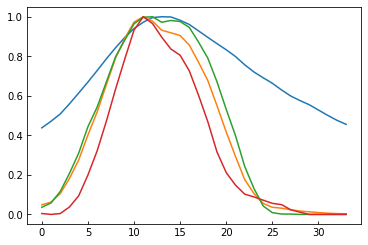

In [252]:
i = 40

plt.plot(h2_den_profiles[i]/np.nanmax(h2_den_profiles[i]))
plt.plot(hc5n_den_profiles[i]/np.nanmax(hc5n_den_profiles[i]))
plt.plot(g1_den_profiles[i]/np.nanmax(g1_den_profiles[i]))
plt.plot(g2_den_profiles[i]/np.nanmax(g2_den_profiles[i]))

What is our physical picture?

Started with the idea of the hc5n swirling around a stable, central cylinder. This is nice for kinematic stability, and indicated the idea of g2 tracing the backbonce.

However, the hc5n is clearly peaking on the north edge of the filament. The h2 falls off evenly and sharpish on the north edge, whereas it fades more ambiently, and clumpily on the south edge. Also, the h5cn peak indicates an area ripe with new gas (aka being fed extra carbon). This leads us to a more global view of understanding how this filament formed/is forming. It's clearly young, also pretty stable. As talked about in [citation] and [citation], cloud collisions form filaments where the collision interface quickly collapses. The filament is probably still being fed gas, and specifically, one cloud could be providing a stronger force, compacting the north edge of the filament. 

This picture is supported by the north edge having younger material, therefore it can still form hc5n. This also still supports g2 as the back bone. Heres why. g2 seems to follow the h2 density much more strongly (though is still a bit to the north), has minimal velocity gradient AND has a lower velocity dispersion, indicating lower temperature, random motions.

However, g1 (on the north edge), is quite abundant with a high velocity dispersion. So as this gas is slamming into the north edge of the filament, it's energy is being pushed around and dispersed, raising the temp and random motions on that edge. Plus, the velocity gradient runs across the filament from North to South, so the gas could be "parting" around the compact parts of the filament. This is could also support the more billowy south edge, as the gas coming from the north has lost it's energy and dissapates frivolously. 

Another idea for why the north edge has HC5N peak emission. We have accretion (it seems to be collapsing thermally...?), and that accretion is almost exactly in our line of site. Maybe a little off. ASK Rachel, but on the back side, there could be some HC5N, but we dont see it because the H2 and other gases absorb it as it passes through? Not the most likely, but at least could be a hint as to the orientation of the filament and its accretion.

### Total Mass and Stability

In [60]:
M_tot = np.nansum(np.ravel(((colden_re/u.cm**2/c.N_A*2.33*u.g/u.mol*pix_scale_au**2).to(u.M_sun))*box_mask))
L_tot = (np.sqrt((0+60-5-8)**2 + 70**2)*pix_scale_au).to(u.pc)

NameError: name 'box_mask' is not defined

In [317]:
M_l = (2*cs**2/c.G).to(u.M_sun/u.pc)

In [318]:
M_l

<Quantity 15.81217726 solMass / pc>

In [319]:
M_tot/L_tot

<Quantity 27.32777292 solMass / pc>

In [350]:
r

<Quantity 0.06756476>

In [345]:
10**4, 1e4

(10000, 10000.0)

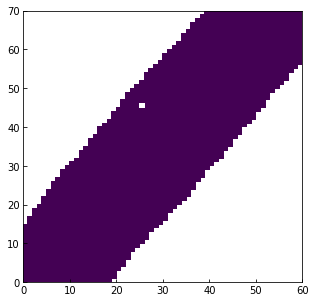

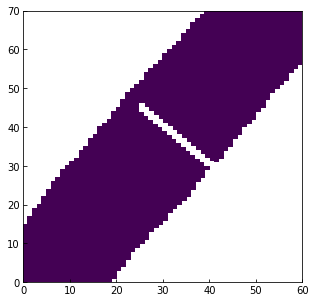

In [61]:
width_line = r_mod.line_dec_inst([25, 45], box_mask, -1)

In [66]:
box_mask[48, 22]

1.0

In [68]:
new_width_line = line_comb(width_line)

In [69]:
len(new_width_line)

30

### 3D Cylindrical Model

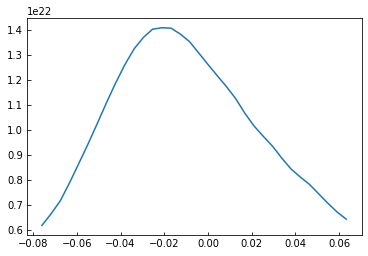

In [323]:

test = h2_den_profiles[40]
r = (width/2).to(u.pc)/u.pc
step = 1/np.sqrt(2)
x = np.arange((-len(test)+1)/2*step, (len(test)+1)/2*step, step)*(pix_scale_au).to(u.pc)/u.pc
plt.plot(x, test)



#plt.xlabel('Radial Distance (pc)')
#plt.ylabel('Column Density (cm$^{-2}$)')
plt.show()

In [348]:
ex = (np.nanmax(test)/u.cm**2/(1e4/u.cm**3)).to(u.pc) - 2*r*u.pc

/Users/simonsmith/anaconda3/lib/python3.6/site-packages/astropy/units/quantity.py:477: RuntimeWarning: invalid value encountered in sqrt
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


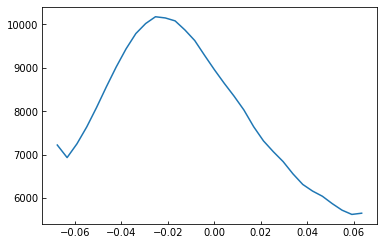

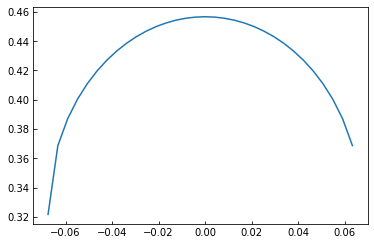

In [351]:
third_dim = 2*np.sqrt((r)**2 - x**2)*u.pc + ex
plt.plot(x, (test/u.cm**2/third_dim).to(1/u.cm**3))
plt.show()
plt.plot(x, third_dim)

In [591]:
2*np.sqrt(r**2 - x**2)

<Quantity [0.06964416, 0.095551  , 0.11330954, 0.12640209, 0.13618112,
           0.14332649, 0.14821958, 0.15107939, 0.1520207 , 0.15107939,
           0.14821958, 0.14332649, 0.13618112, 0.12640209, 0.11330954,
           0.095551  , 0.06964416, 0.        ] pc>

In [597]:
r

<Quantity 0.07601035 pc>

In [564]:
r.to(u.pc)

<Quantity 0.08023315 pc>

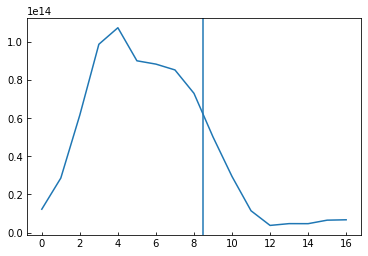

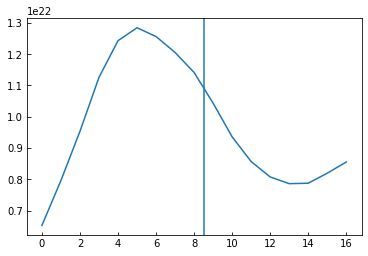

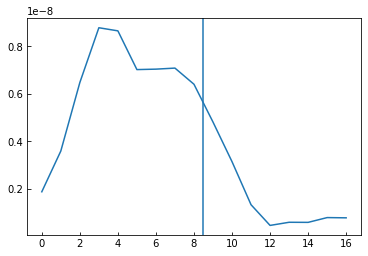

In [407]:
n = 18

plt.plot(strips[n][1::2])
plt.axvline(len(strips[n][1::2])/2)
plt.show()
plt.plot(strips_2[n][1::2])
plt.axvline(len(strips[n][1::2])/2)
plt.show()
plt.plot(np.array(strips[n][1::2])/np.array(strips_2[n][1::2]))
plt.axvline(len(strips[n][1::2])/2)
plt.show()

### For finding the backbone

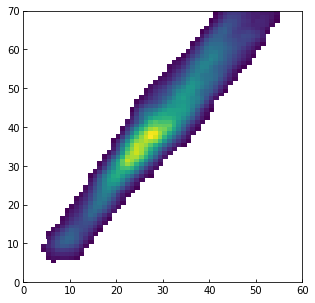

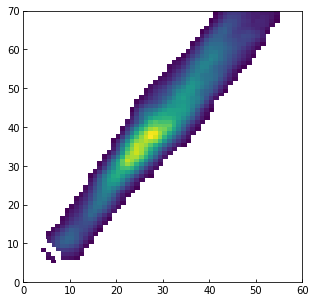

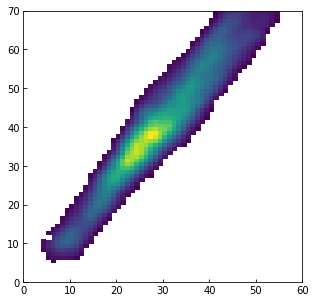

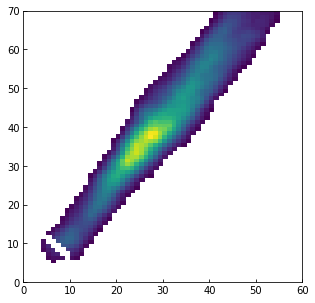

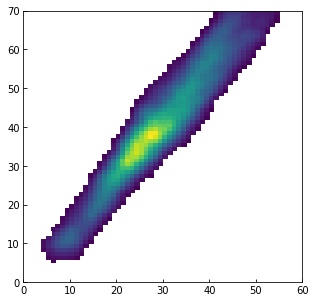

...

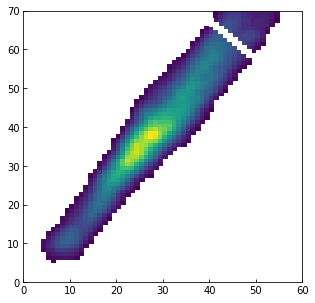

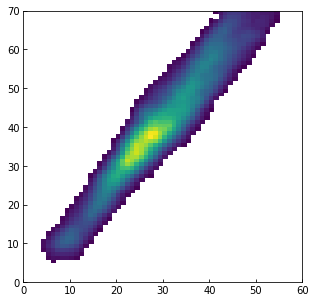

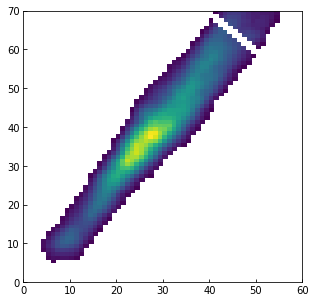

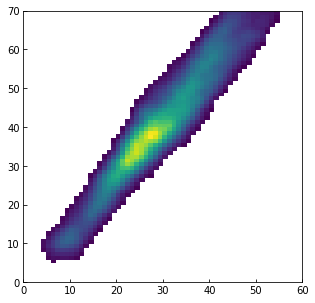

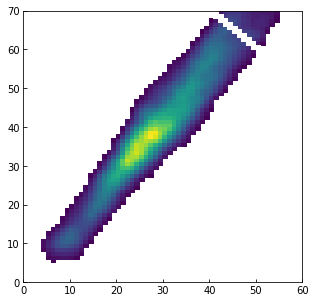

In [52]:
all_strips = []
for i in hc5n_edges[10:]:
    strip = r_mod.line_dec_inst(i, ls_gt*n_ls_gt, -1)
    all_strips.append(strip)

In [94]:
ridge = []
for i in all_strips:
    pt_y, pt_x = np.where(n_ls_gt == np.nanmax(i)/u.m**2)
    ridge.append(np.array([pt_x[0], pt_y[0]]))
ridge = np.array(ridge)

In [71]:
edges[10+0]

[4, 10]

In [84]:
max(all_strips[0])/u.m**2

<Quantity 5.65157109e+13 1 / m2>

In [85]:
n_ls_gt[8][6]

<Quantity 5.65157109e+13 1 / m2>

In [107]:
ridge_img = np.zeros(n_ls_gt.shape)
for i in ridge:
    ridge_img[i[1], i[0]] = 100

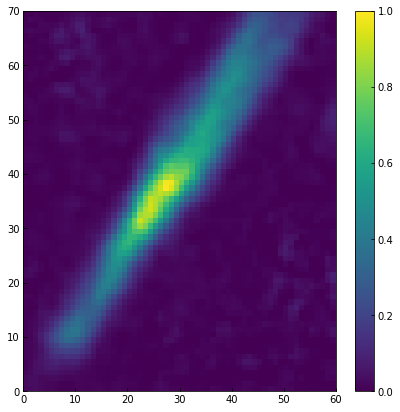

In [111]:
plt.figure(figsize=(7, 7))
plt.pcolormesh(ridge_img, cmap='inferno')
plt.pcolormesh(n_ls_gt/np.nanmax(n_ls_gt))
plt.colorbar()
plt.show()

### 3d plotting the density

In [72]:
np.linspace(1, 1, 20)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1.])

(120, 150)

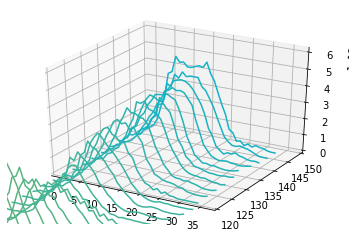

In [540]:
fig = plt.figure()
ax = plt.axes(projection='3d')
n=0
for i in g2_den_profiles[::]:
    ax.plot3D(np.arange(0, len(i)), np.linspace(n, n, len(i)), i, color=(((160-n)/200), 0.7, ((n+10)/200)))
    n+=3
ax.set_ylim([120, 150])

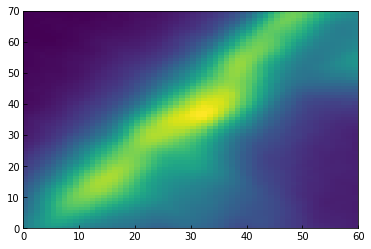

In [305]:
plt.pcolormesh(colden_re)

In [310]:
(np.sqrt((0+60-5-8)**2 + 70**2)*pix_scale_au).to(u.pc)

<Quantity 0.50352321 pc>

### Distribution of overdensities in G2

In [86]:
peaks = find_peaks(g2_intensity, 0.2)
peak_pts = np.zeros(g2_intensity.shape)

for i in peaks:
    peak_pts[i[1]][i[0]] = 0.1

dists = []
for i in range(0, len(peaks)-1):
    x1, y1 = peaks[i][0], peaks[i][1]
    x2, y2 = peaks[i+1][0], peaks[i+1][1]
    dists.append(pix_scale_au*r_mod.dist(x1, y1, x2, y2)/u.au)
dists = np.asarray(dists) 

In [87]:
peaks

x_peak,y_peak,peak_value
int64,int64,float64
10,13,0.2792122506468341
17,21,0.25121930248887886
21,28,0.22158849897814667
29,37,0.24124416354160447
31,40,0.26488752732510723
41,57,0.21851951905207442
44,60,0.22285335716683824
47,63,0.26888317491214475
46,68,0.27941695377158793


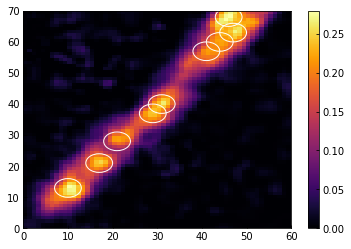

In [88]:

circle1 = plt.Circle((10, 13), 3, color='white', fill=False)
circle2 = plt.Circle((17, 21), 3, color='white', fill=False)
circle3 = plt.Circle((21, 28), 3, color='white', fill=False)
circle4 = plt.Circle((29, 37), 3, color='white', fill=False)
circle5 = plt.Circle((31, 40), 3, color='white', fill=False)
circle6 = plt.Circle((41, 57), 3, color='white', fill=False)
circle7 = plt.Circle((44, 60), 3, color='white', fill=False)
circle8 = plt.Circle((47, 63), 3, color='white', fill=False)
circle9 = plt.Circle((46, 68), 3, color='white', fill=False)
ax = plt.gca()
ax.add_artist(circle1)
ax.add_artist(circle2)
ax.add_artist(circle3)
ax.add_artist(circle4)
ax.add_artist(circle5)
ax.add_artist(circle6)
ax.add_artist(circle7)
ax.add_artist(circle8)
ax.add_artist(circle9)


plt.pcolormesh(peak_pts, color='black')
plt.pcolormesh(g2_intensity, cmap='inferno')
plt.colorbar()
#plt.contour(nh3_tmc1.data, colors='white', levels=[1, 2.5, 4.5, 6])
plt.show()


We take our model under this formulation: G2 is carbon material that is situated along the core of the filament. This is the densest, most stable region of the filament. Also called the crest, this H$_2$ is begining to condense, seeding the locations of future stars. We see the HC$_5$N to the northern edge of the core as this is where material is accreting from. However, we still see the HC$_5$N tracing the denser parts of the core. At the highest densities, the carbon molecule is destroyed due to many collisions, so it's emission drops off. We know $NH_3$ traces the densest gas, so comparing the two maps, we see HC$_5$N emission outlining locations of dense NH$_3$. this is most clearly seen at the south eastern edge of the the filament where to peaks in carbon emission saddle up to a peak in ammonia. G1 represents the carbon material that is falling into the H$_2$. This material is in a thick shell surrounding the core and has much more movement in general though that will be discussed futher elsewhere.

I want to sitll examine the physical size which encompasses two neighbouring peaks. Also, wherever I have nearby double peaks, (4,5) for example, check if the difference in peak height is less than the noise level of the map. If so, consider tham one peak.

In [89]:
np.std(g2_intensity[0:30, 40:60])
#peaks

0.0041360395912774794

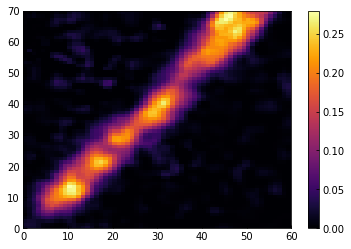

In [90]:
plt.pcolormesh(g2_intensity, cmap='inferno')
plt.colorbar()
#plt.contour(nh3_tmc1.data, colors='white', levels=[1, 2.5, 4.5, 6])
plt.show()

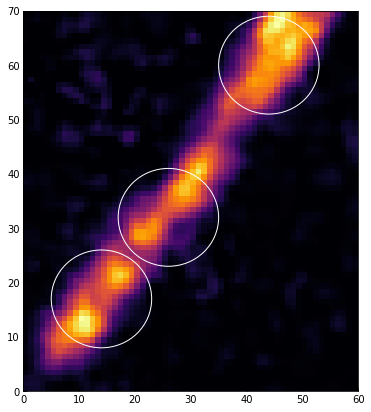

In [151]:
circle1 = plt.Circle((14, 17), 9, color='white', fill=False)
circle2 = plt.Circle((26, 32), 9, color='white', fill=False)
circle3 = plt.Circle((44, 60), 9, color='white', fill=False)

plt.figure(figsize=(6, 7))

ax = plt.gca()
ax.add_artist(circle1)
ax.add_artist(circle2)
ax.add_artist(circle3)



plt.pcolormesh(peak_pts, color='black')
plt.pcolormesh(g2_intensity, cmap='inferno')
#plt.colorbar()
#plt.contour(nh3_tmc1.data, colors='white', levels=[1, 2.5, 4.5, 6])
plt.show()

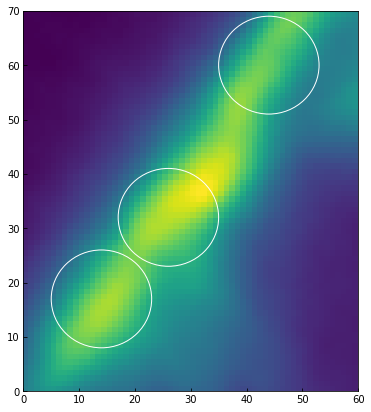

In [152]:
plt.figure(figsize=(6, 7))
plt.pcolormesh(colden_re)
circle1 = plt.Circle((14, 17), 9, color='white', fill=False)
circle2 = plt.Circle((26, 32), 9, color='white', fill=False)
circle3 = plt.Circle((44, 60), 9, color='white', fill=False)

ax = plt.gca()
ax.add_artist(circle1)
ax.add_artist(circle2)
ax.add_artist(circle3)

In [109]:
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = (int(w/2), int(h/2))
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)

    mask = dist_from_center <= radius
    return mask

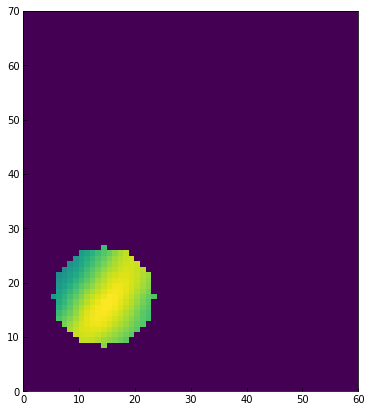

In [153]:
circ1 = create_circular_mask(h=70, w=60, center=(14, 17), radius=9)
circ2 = create_circular_mask(h=70, w=60, center=(26, 32), radius=9)
circ3 = create_circular_mask(h=70, w=60, center=(44, 60), radius=9)
plt.figure(figsize=(6, 7))
plt.pcolormesh(circ1*colden_re)
#plt.pcolormesh(circ2*colden_re)
#plt.pcolormesh(circ3*colden_re)
plt.show()

In [180]:
p1 = (np.nanmean(circ1*colden_re)/u.cm**2/(0.1*u.pc)).to(1/u.cm**3)*c.m_p*2.33
p2 = (np.nanmean(circ2*colden_re)/u.cm**2/(0.1*u.pc)).to(1/u.cm**3)*c.m_p*2.33
p3 = (np.nanmean(circ3*colden_re)/u.cm**2/(0.1*u.pc)).to(1/u.cm**3)*c.m_p*2.33
p = 1e4/u.cm**3*c.m_p*2.8

m1 = ((np.nansum(circ1*colden_re)/u.cm**2*pix_scale_au**2)*c.m_p*2.8).to(u.M_sun)
m2 = ((np.nansum(circ2*colden_re)/u.cm**2*pix_scale_au**2)*c.m_p*2.8).to(u.M_sun)
m3 = ((np.nansum(circ3*colden_re)/u.cm**2*pix_scale_au**2)*c.m_p*2.8).to(u.M_sun)

In [181]:
(cs/np.sqrt(c.G*p)).to(u.pc)

<Quantity 0.10688828 pc>

In [184]:
18*pix_scale_au.to(u.pc)

<Quantity 0.10749487 pc>

In [175]:
m1, m2, m3

(<Quantity 2.03655861 solMass>,
 <Quantity 2.22388687 solMass>,
 <Quantity 1.85897191 solMass>)

In [16]:
dists*u.au.to(u.pc)

array([0.06348256, 0.0481473 , 0.07191165, 0.02153213, 0.11778501,
       0.02533678, 0.02533678, 0.03045102])

In [17]:
f = int((peaks[0][0] + peaks[1][0])/2), int((peaks[0][1] + peaks[1][1])/2)

In [18]:
s = int((peaks[2][0] + peaks[3][0])/2), int((peaks[2][1] + peaks[3][1])/2)

In [19]:
t = int((peaks[7][0] + peaks[8][1])/2), int((peaks[7][1] + peaks[8][1])/2)

In [20]:
(pix_scale_au*r_mod.dist(f[0], f[1], s[0], s[1])).to(u.pc)

<Quantity 0.11471717 pc>

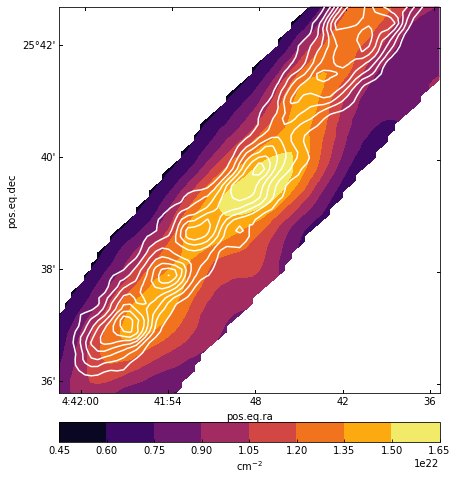

In [120]:
fig = plt.figure(figsize=(15,9))
ax1 = fig.add_subplot(121, projection=tmc1.wcs)
im = ax1.contourf(box_mask*colden_re,cmap='inferno')
ax1.contour(n_ls_g2*u.m**2, colors='white')
#ax1.text(0.15,0.7,'N(H$_2$)',size=14,color='white',transform=ax1.transAxes)
cbar = plt.colorbar(im,pad=0.06,orientation='horizontal')
cbar.set_label('cm$^{-2}$')
ra = ax1.coords[0]
ra.set_major_formatter('hh:mm:ss')
ra.set_separator(':')